# <font color='purple'>Preprocessing QC statistics </font> 
### October 2024

In [2]:
import os
NOVA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps'
NOVA_DATA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps'
LOGS_PATH = os.path.join(NOVA_DATA_HOME, "outputs/preprocessing/spd/logs/preprocessing_Dec2023")
PLOT_PATH = os.path.join(NOVA_HOME, 'src', 'preprocessing', 'notebooks','figures','Neurons')
os.chdir(NOVA_HOME)
import pandas as pd
import contextlib
import io
from IPython.display import display, Javascript

from tools.preprocessing_tools.qc_reports.qc_utils import log_files_qc, run_validate_folder_structure, display_diff, sample_and_calc_variance, \
                                                show_site_survival_dapi_brenner, show_site_survival_dapi_cellpose, \
                                                show_site_survival_dapi_tiling, show_site_survival_target_brenner, \
                                                calc_total_sums, plot_filtering_heatmap, show_total_sum_tables, \
                                                plot_cell_count, plot_catplot, plot_hm_combine_batches, plot_hm, \
                                                run_calc_hist_new
                                                
from tools.preprocessing_tools.qc_reports.qc_config import panels, markers, marker_info, cell_lines, cell_lines_to_cond,\
                                    cell_lines_for_disp, reps, line_colors, lines_order, custom_palette,\
                                    expected_dapi_raw
%load_ext autoreload
%autoreload 2

In [12]:
# choose batches
batches = [f'batch{i}' for i in range(6,10)]

In [14]:
df = log_files_qc(LOGS_PATH, batches)
df_dapi = df[df.marker=='DAPI']
df_target = df[df.marker!='DAPI']

reading logs of batch9_original_with_brenner
reading logs of batch6_original_with_brenner
reading logs of batch7_original_with_brenner
reading logs of batch8_original_with_brenner

Total of 6 files were read.
Before dup handeling  (253270, 22)
After duplication removal #1: (252309, 23)
After duplication removal #2: (250659, 23)


## Actual Files Validation

### Raw Files Validation

1. How many site **tiff** files do we have in each folder?
2. Are all existing files valid? (tif, at least 2049kB, not corrupetd)

batch6
Folder structure is valid.
No bad files are found.
Total Sites:  57600


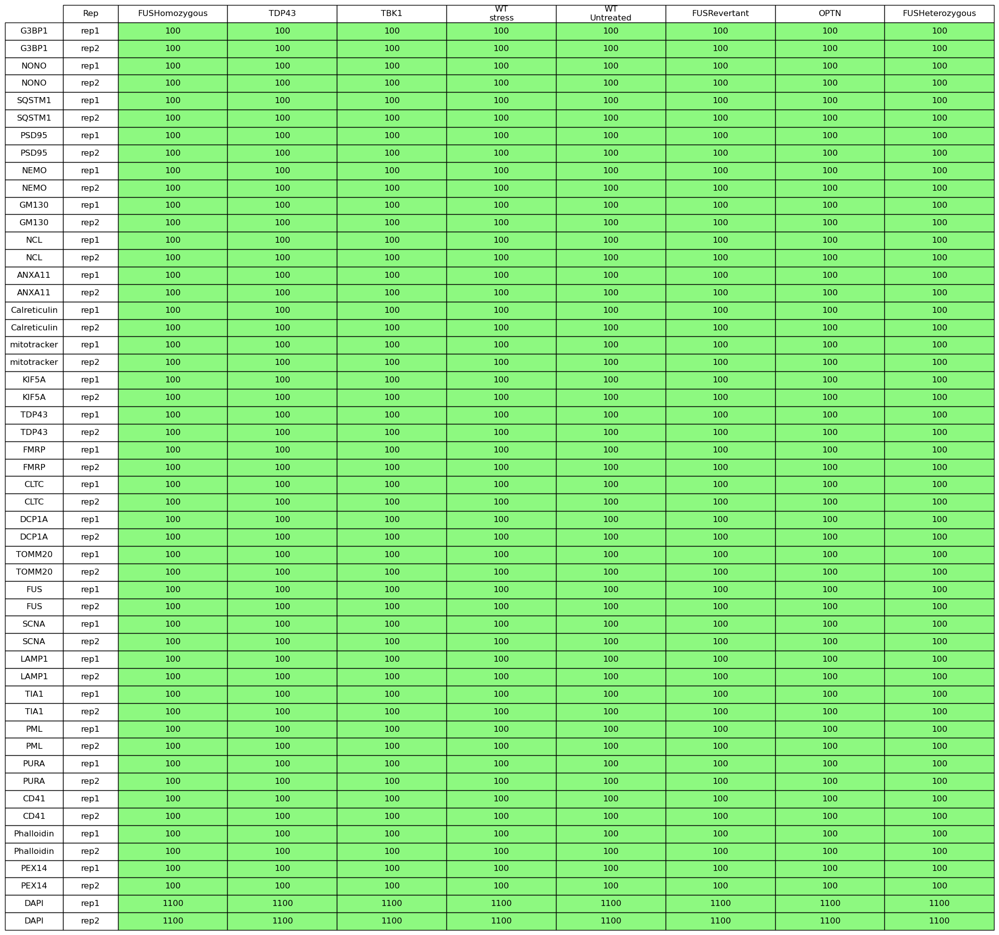

batch7
Folder structure is valid.
No bad files are found.
Total Sites:  57600


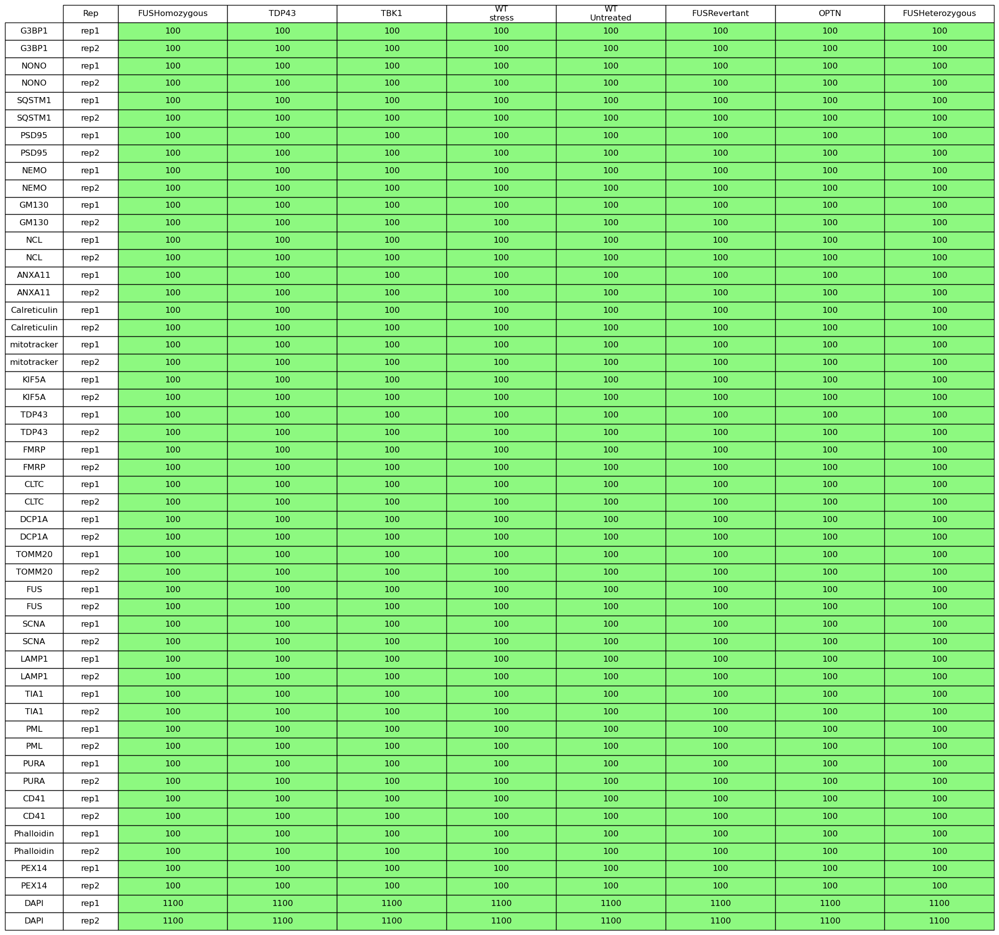

batch8
Folder structure is valid.
No bad files are found.
Total Sites:  57600


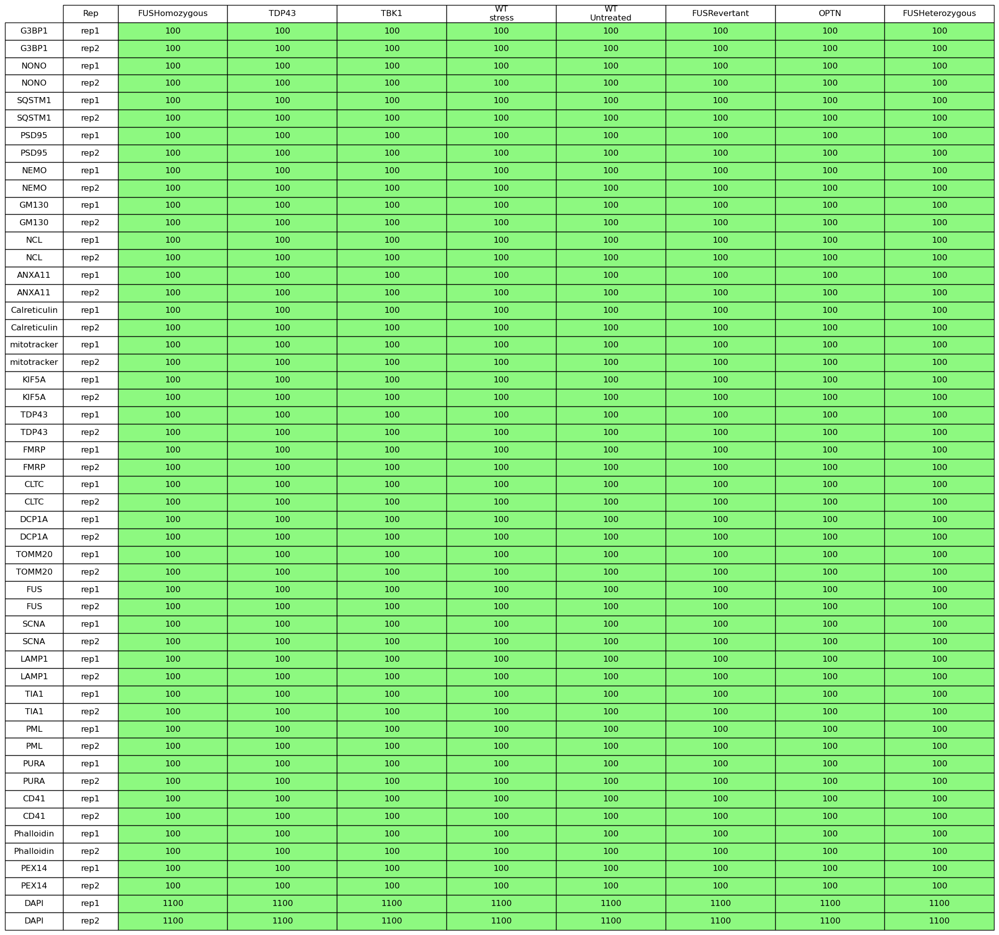

batch9
Folder structure is valid.
No bad files are found.
Total Sites:  57600


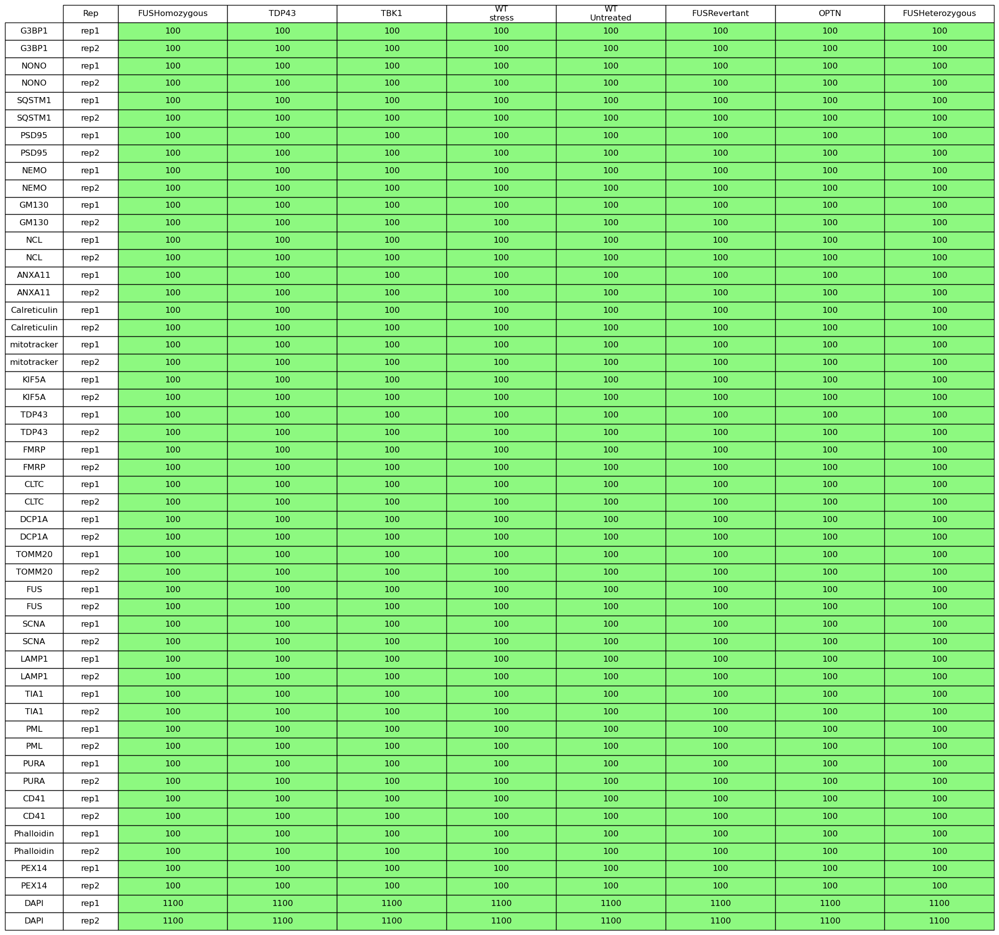

In [4]:

root_directory_raw = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'raw', 'SpinningDisk')

batches_raw = [batch.replace("_16bit_no_downsample","") for batch in batches]
raws = run_validate_folder_structure(root_directory_raw, False, panels, markers,PLOT_PATH,marker_info,
                                    cell_lines_to_cond, reps, cell_lines_for_disp, expected_dapi_raw,
                                     batches=batches_raw)

### Processed Files Validation

1. How many site **npy** files do we have in each folder? -> How many sites survived the pre-processing?
2. Are all existing files valid? (at least 100kB, npy not corrupted)

batch6
Folder structure is valid.
No bad files are found.
Total Sites:  55828


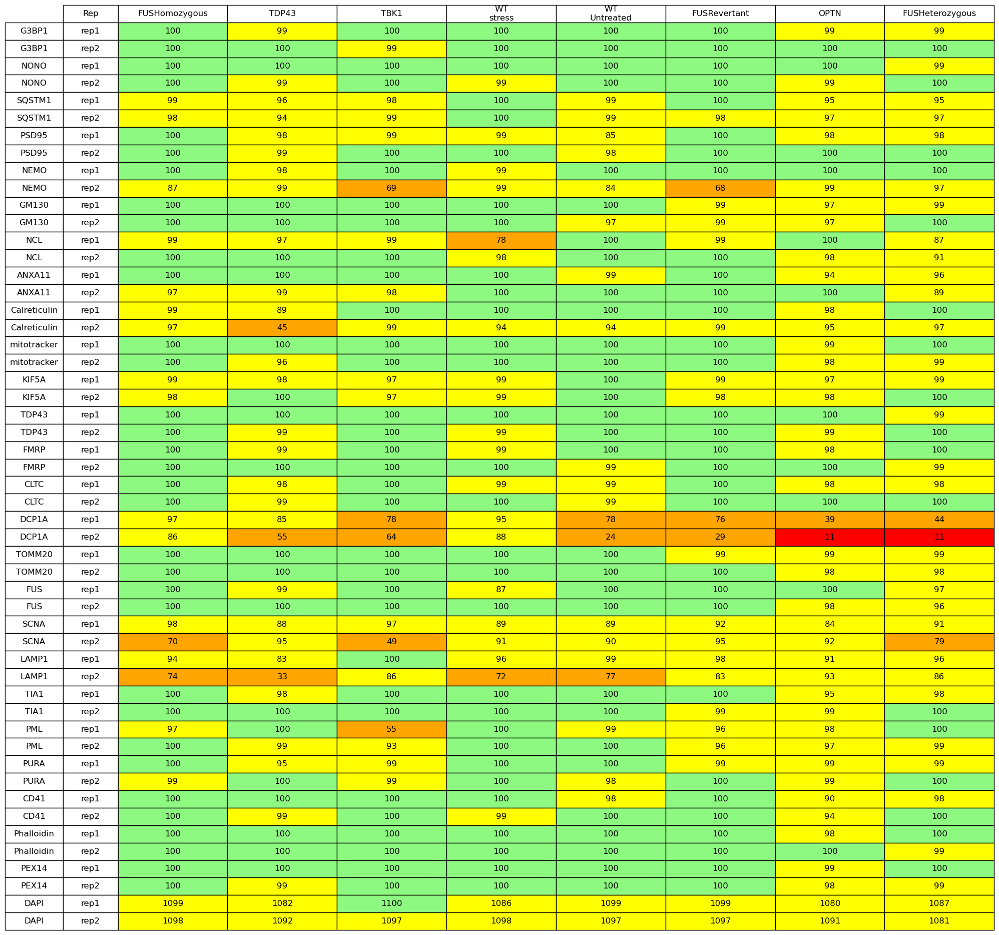

batch7
Folder structure is valid.
No bad files are found.
Total Sites:  56071


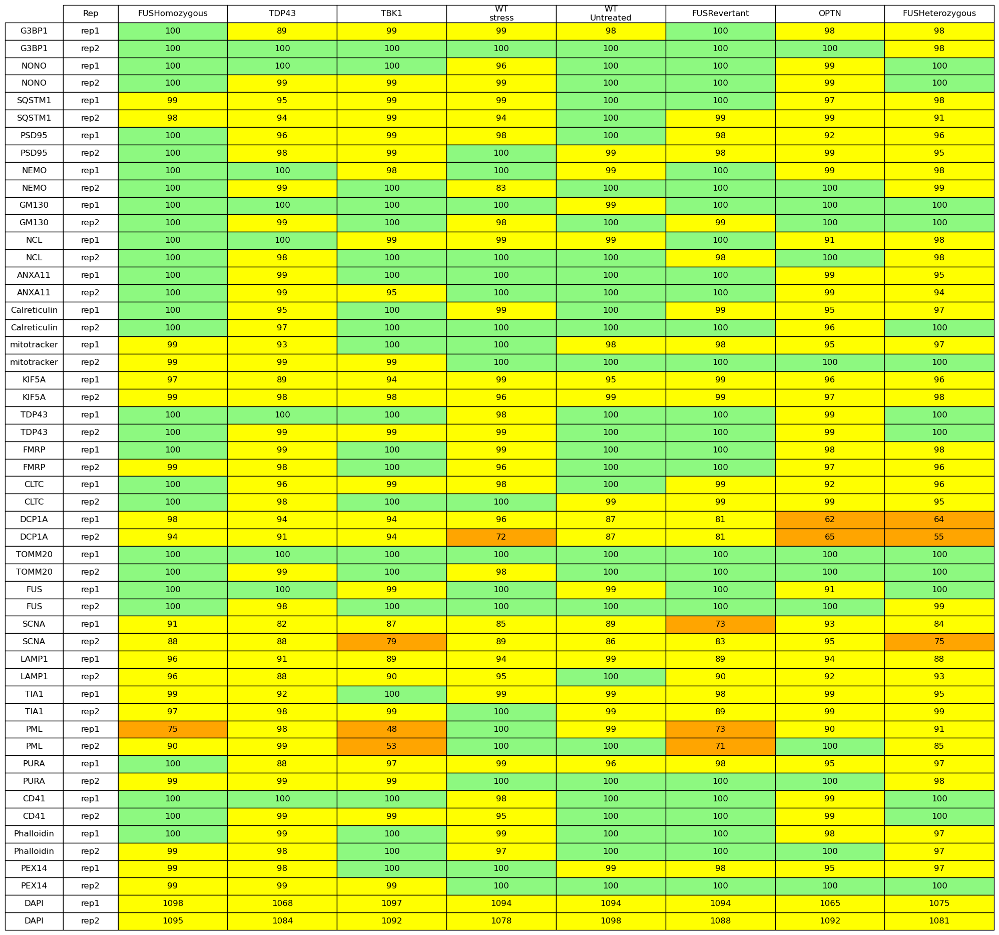

batch8
Folder structure is valid.
No bad files are found.
Total Sites:  55505


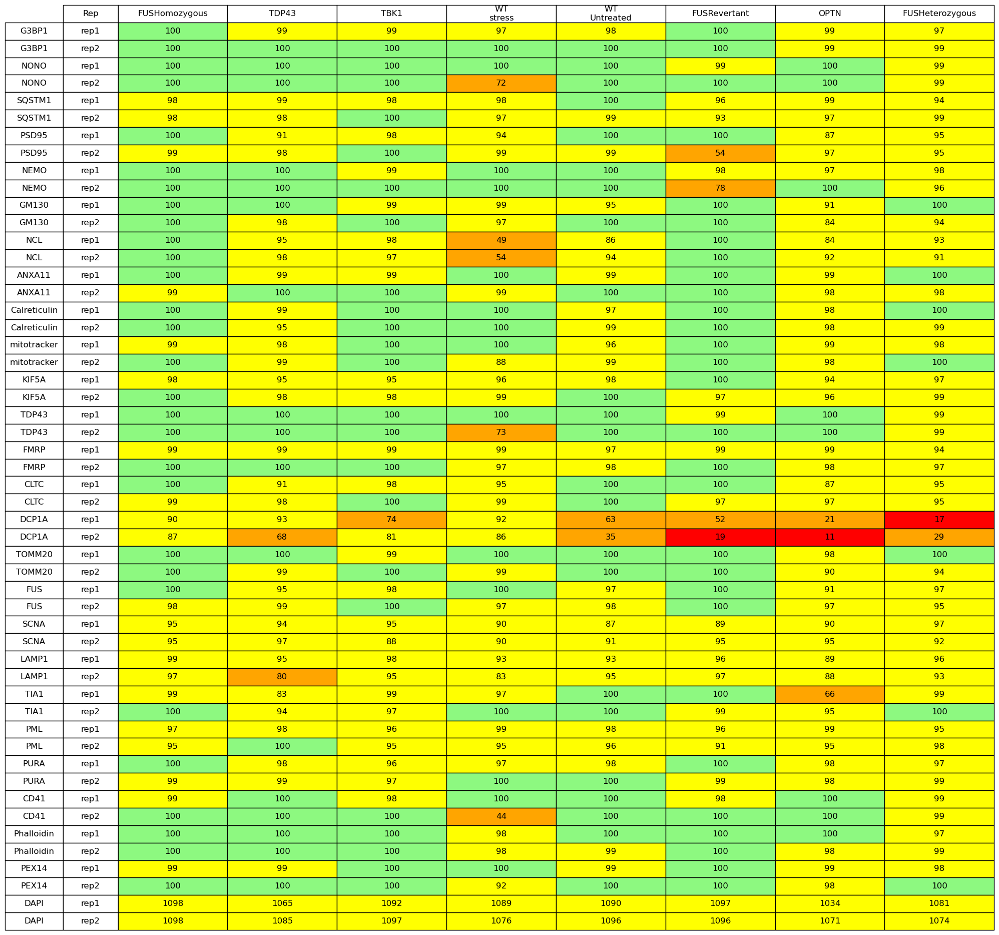

batch9
Folder structure is valid.
No bad files are found.
Total Sites:  55574


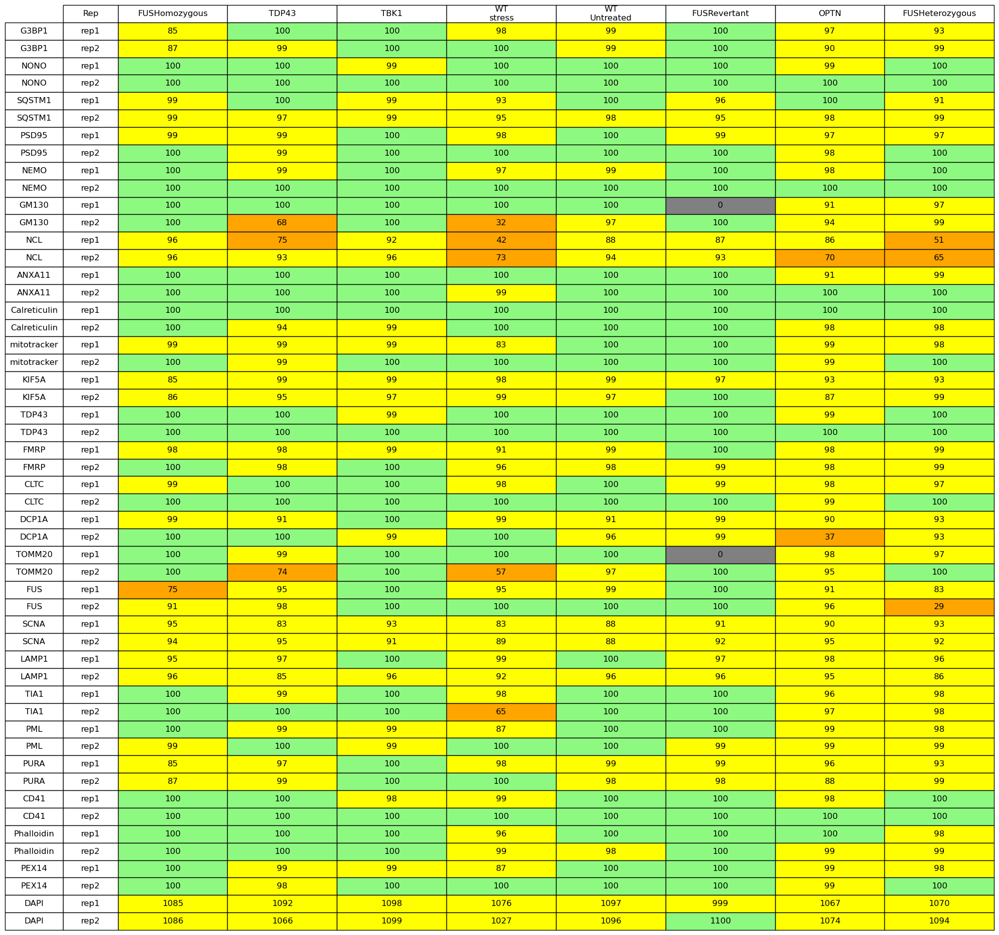

In [5]:
root_directory_proc = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'processed', 'spd2',
                              'SpinningDisk')
procs = run_validate_folder_structure(root_directory_proc, True, panels, markers,PLOT_PATH,marker_info,
                                    cell_lines_to_cond, reps, cell_lines_for_disp, expected_dapi_raw,
                                     batches=batches)

### Difference between Raw and Processed

batch6


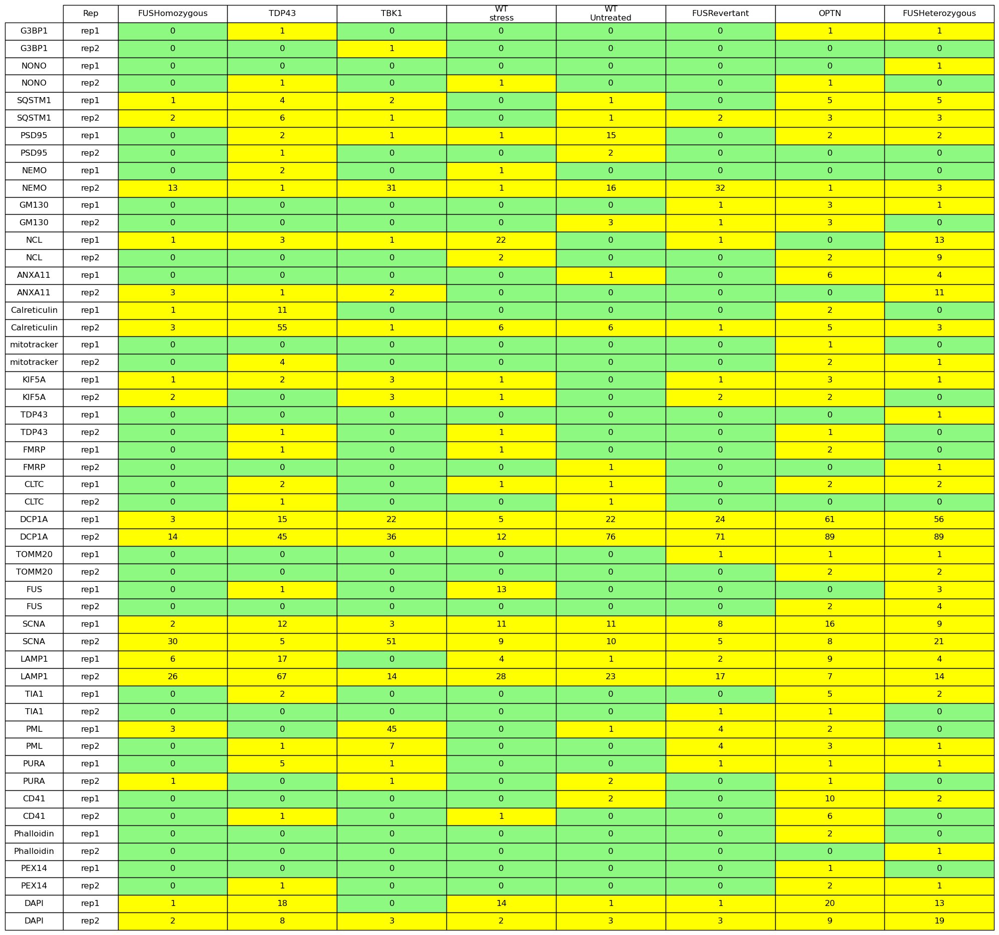

batch7


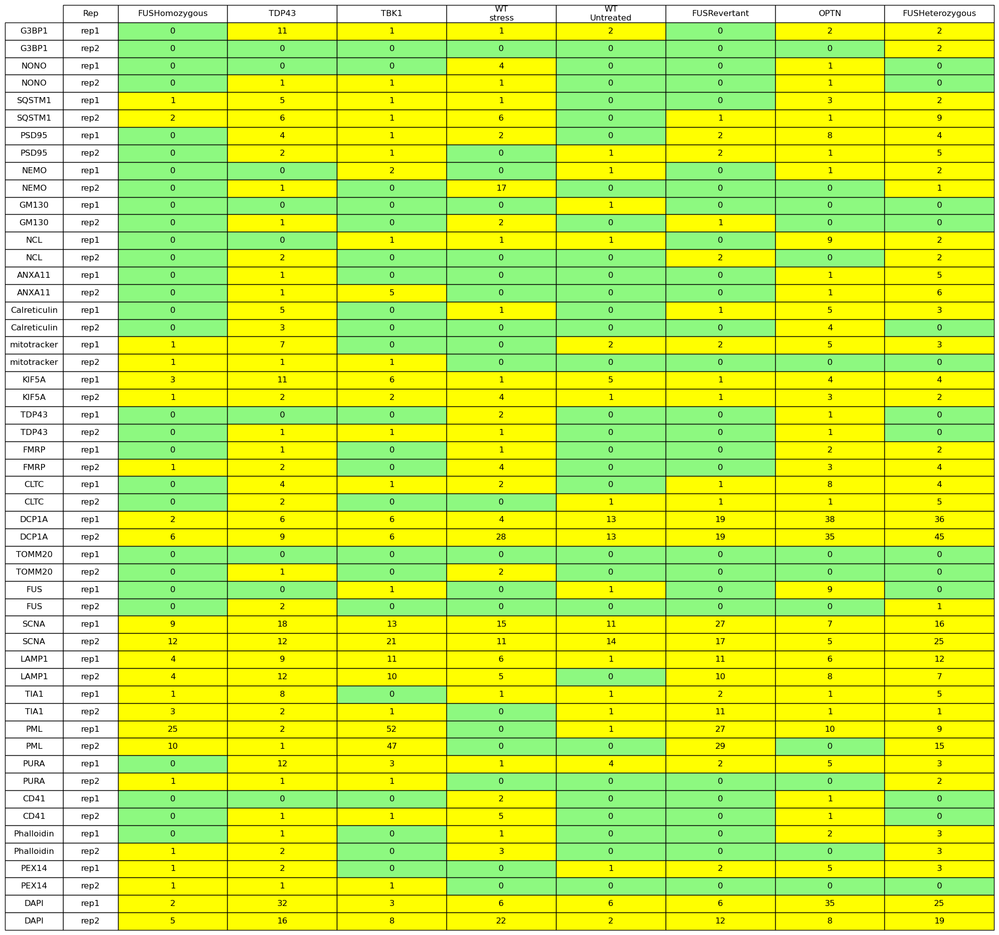

batch8


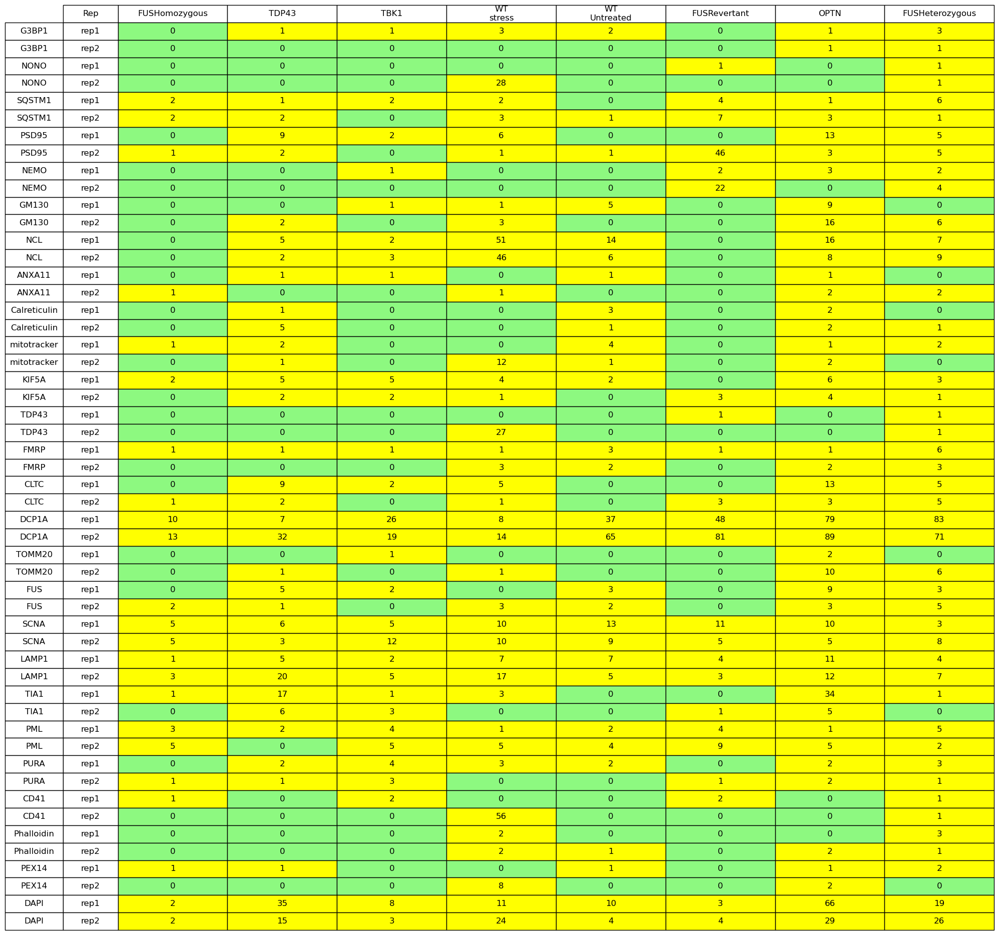

batch9


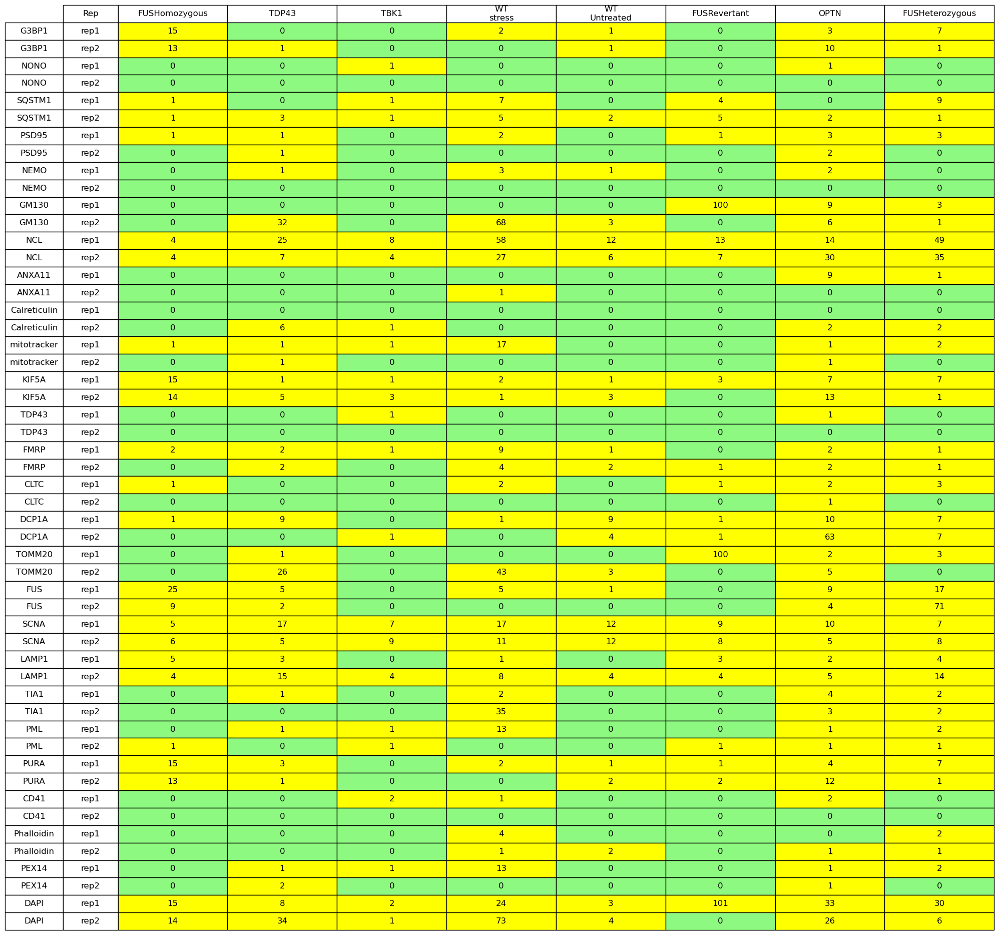

In [6]:
display_diff(batches, raws, procs, PLOT_PATH)

### Variance in each batch (of processed files)

In [7]:
for batch in batches:
    with contextlib.redirect_stdout(io.StringIO()):
        var = sample_and_calc_variance(root_directory_proc, batch, 
                                       sample_size_per_markers=200, num_markers=26)
    print(f'{batch} var: ',var)

batch6 var:  0.01645988503887796
batch7 var:  0.016082496154033385
batch8 var:  0.01643550375364174
batch9 var:  0.016846129673614187


## Preprocessing Filtering qc
By order of filtering

### 1. % site survival after Brenner on DAPI channel
Percentage out of the total sites

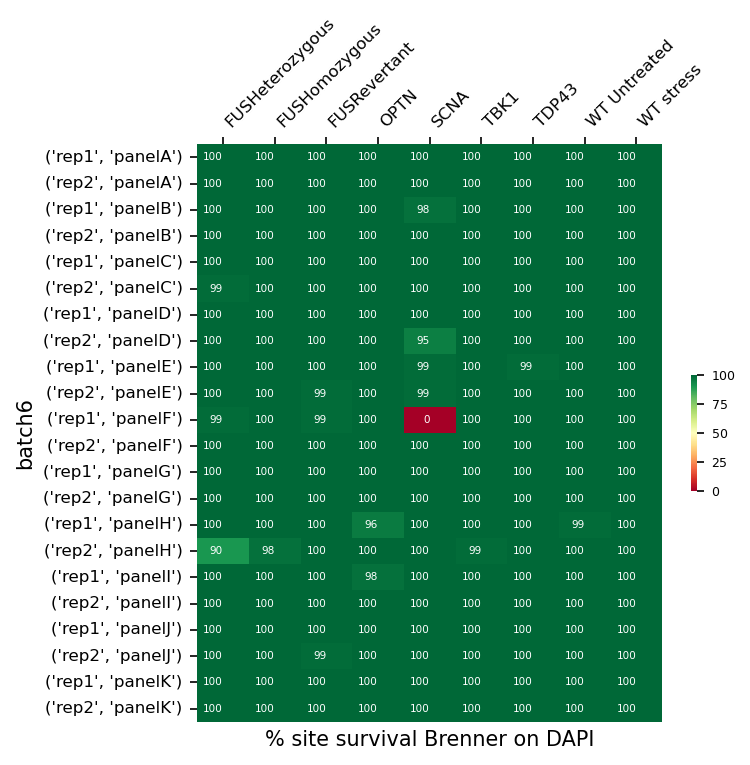

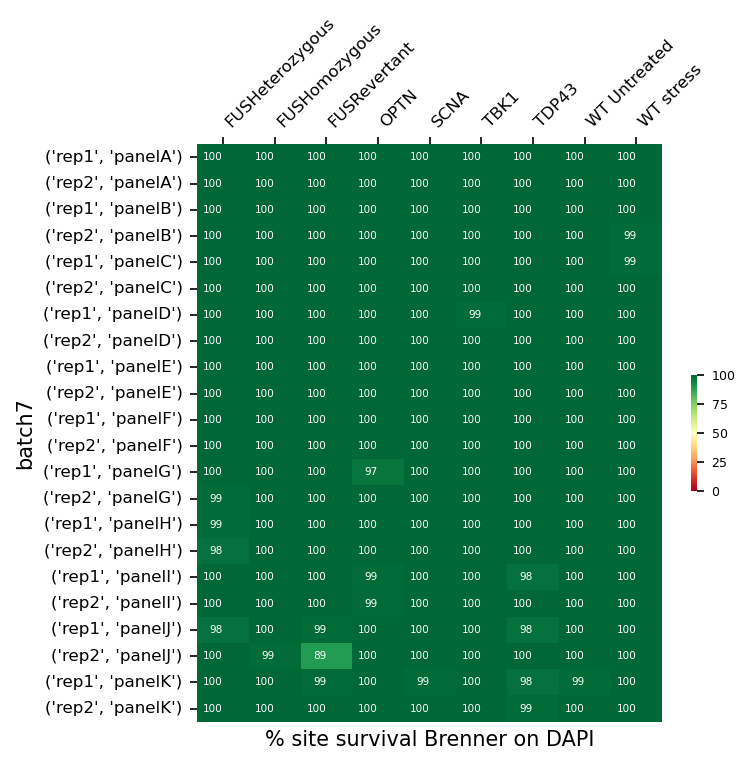

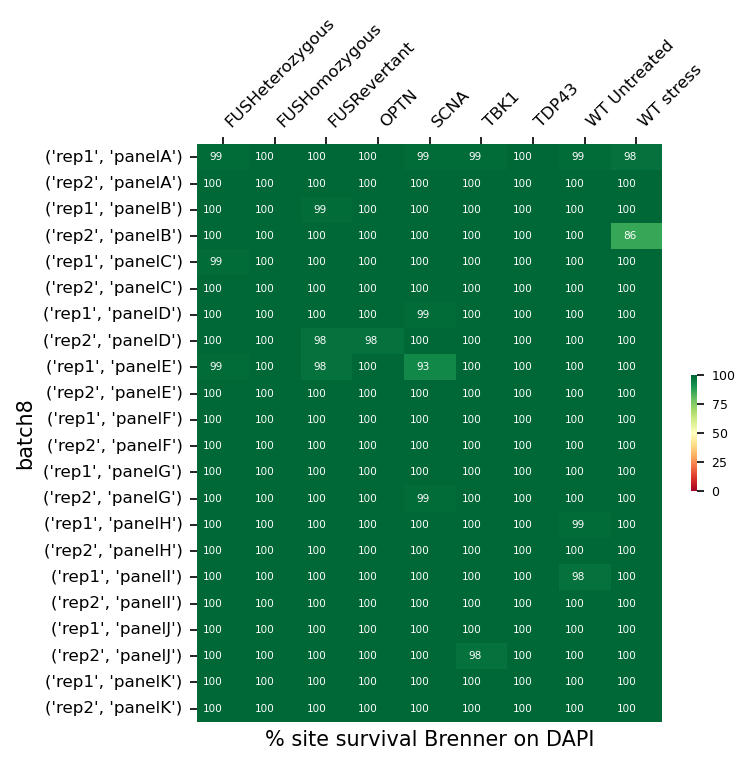

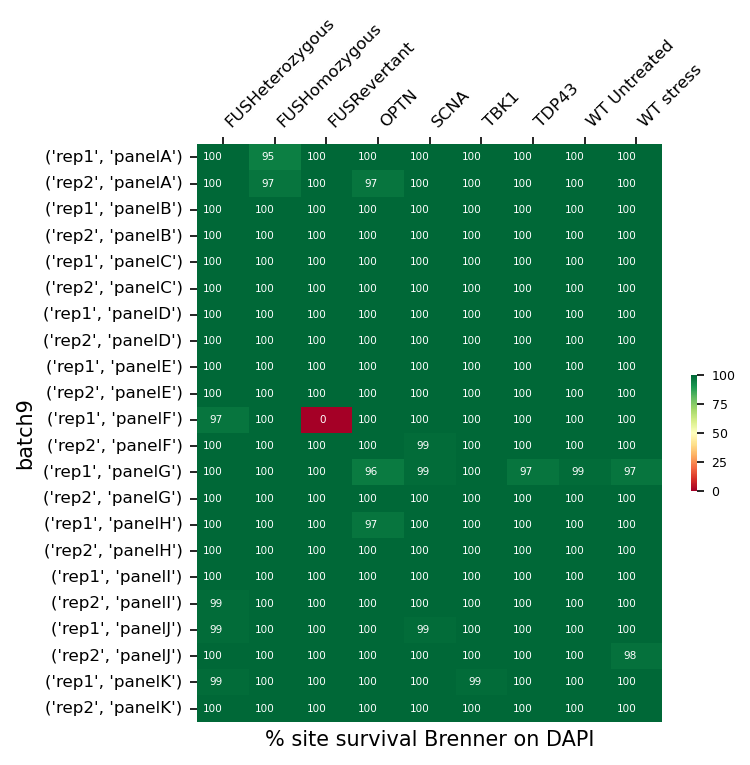

In [15]:
dapi_filter_by_brenner = show_site_survival_dapi_brenner(df_dapi,batches, line_colors, panels, reps)

### 2. % Site survival after Cellpose
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if Cellpose found 0 cells in it.**

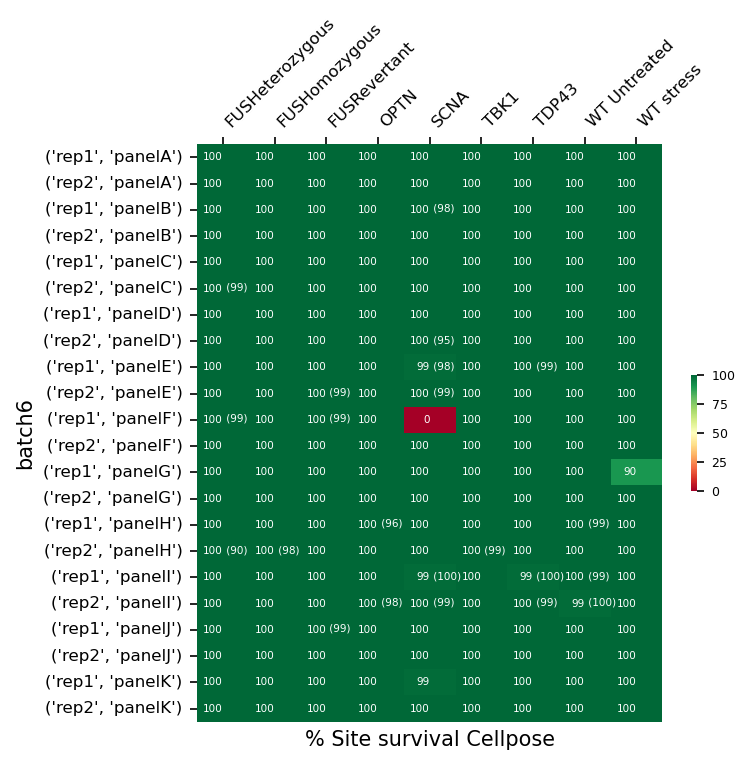

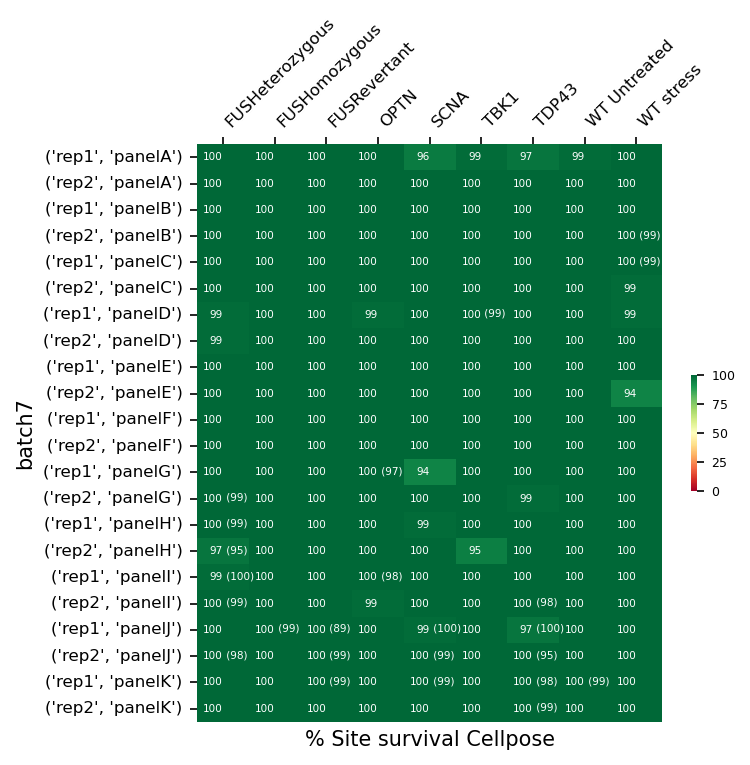

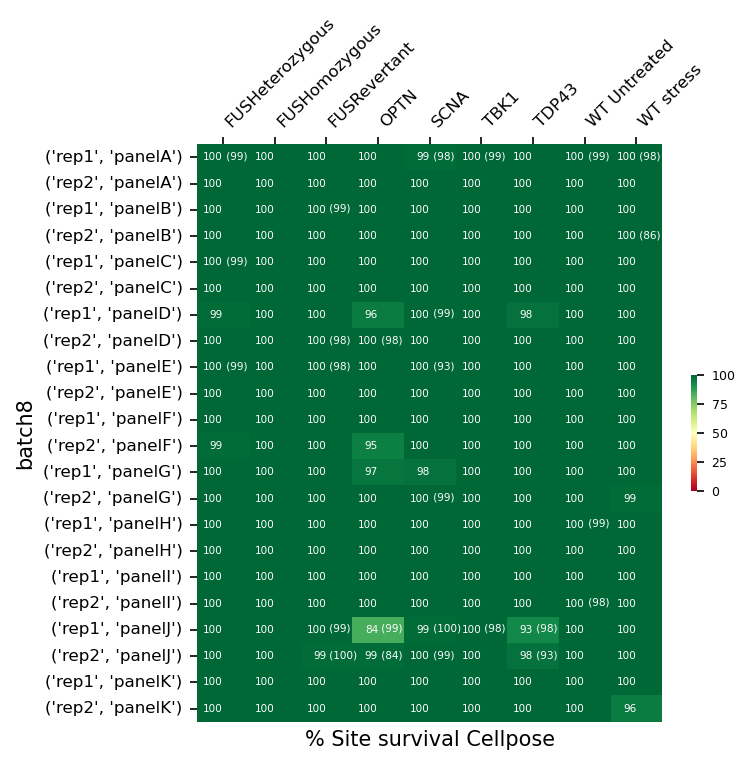

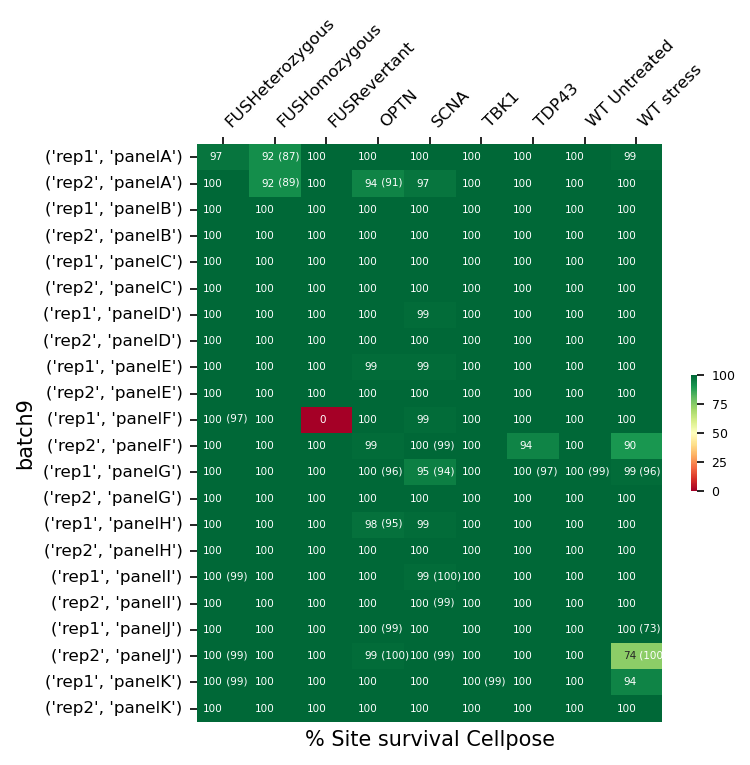

In [16]:
dapi_filter_by_cellpose = show_site_survival_dapi_cellpose(df_dapi, batches, dapi_filter_by_brenner, line_colors, panels, reps)

### 3. % Site survival by tiling
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if after tiling, no tile is containing at least one whole cell that Cellpose detected.**

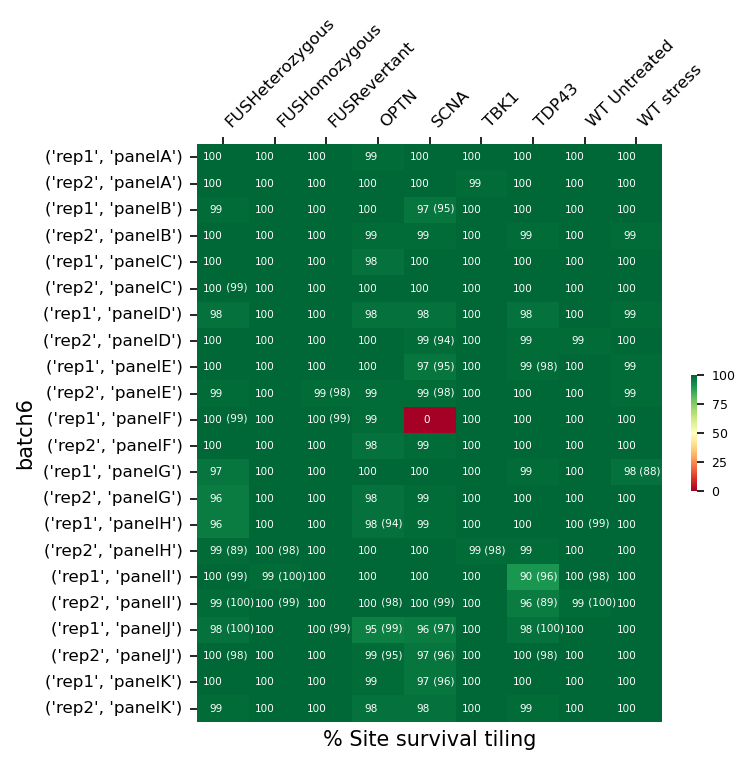

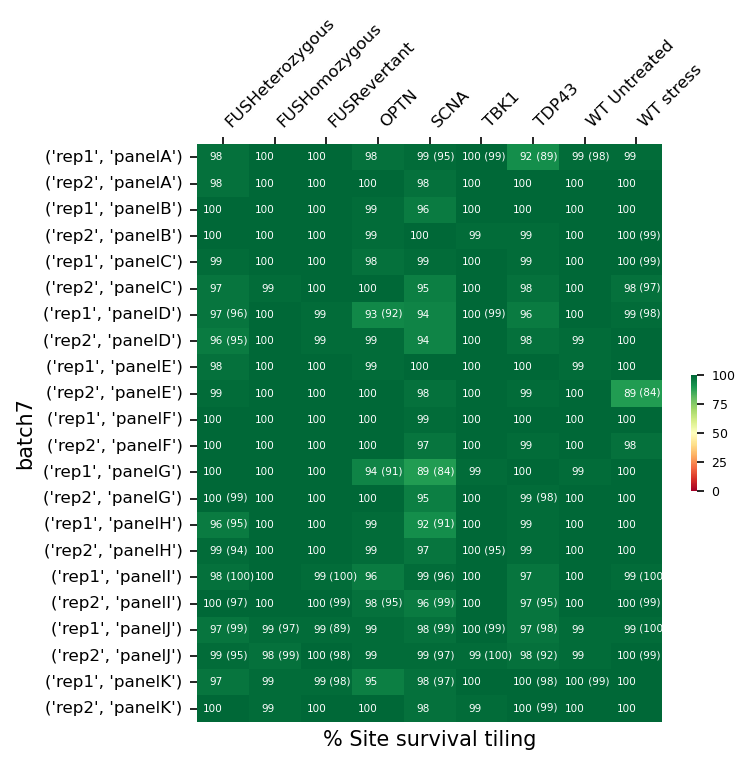

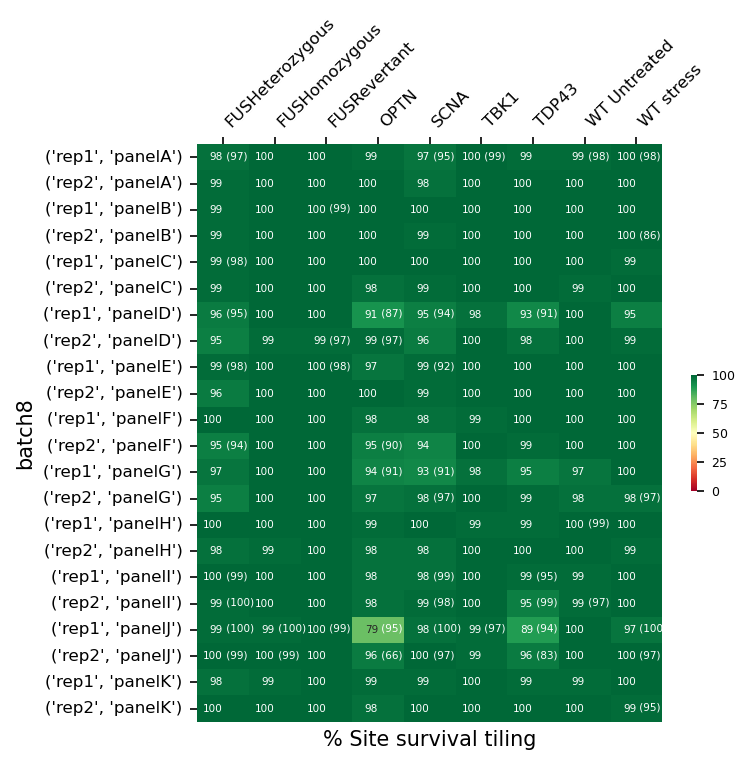

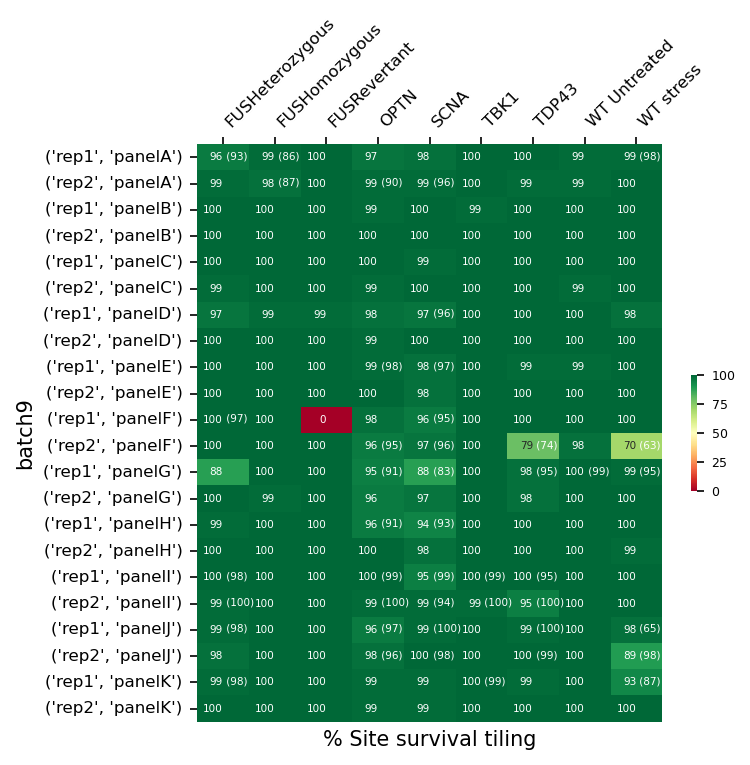

In [17]:
dapi_filter_by_tiling=show_site_survival_dapi_tiling(df_dapi, batches, dapi_filter_by_cellpose, line_colors, panels, reps)

### 4. % Site survival after Brenner on target channel
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

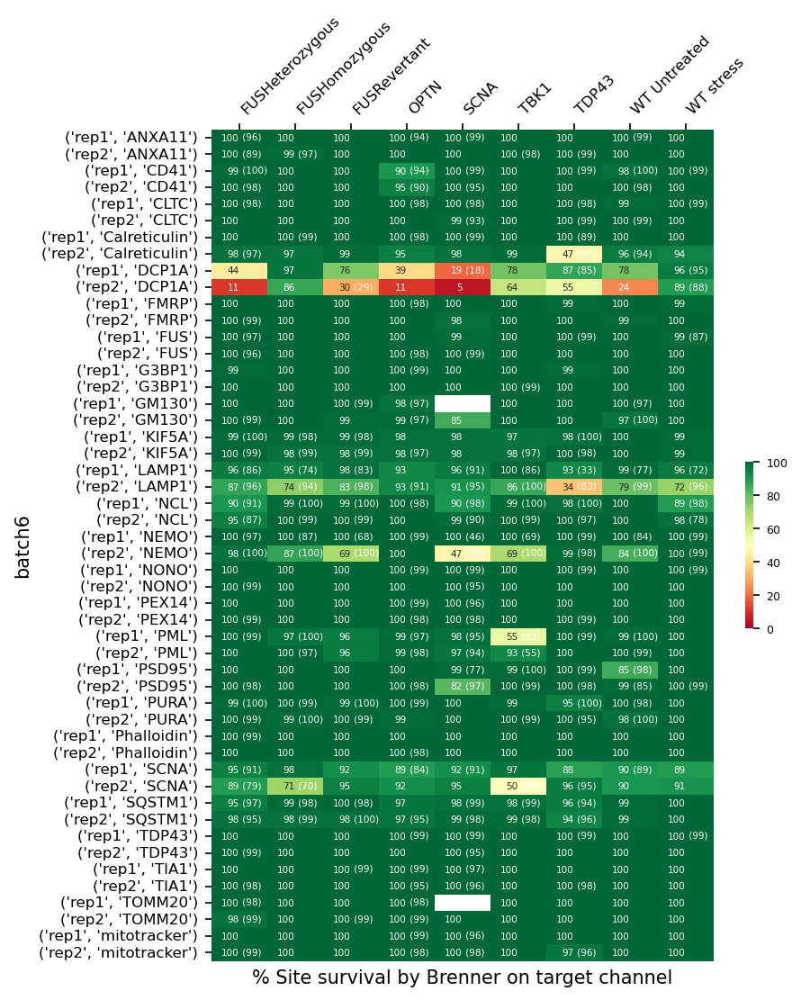

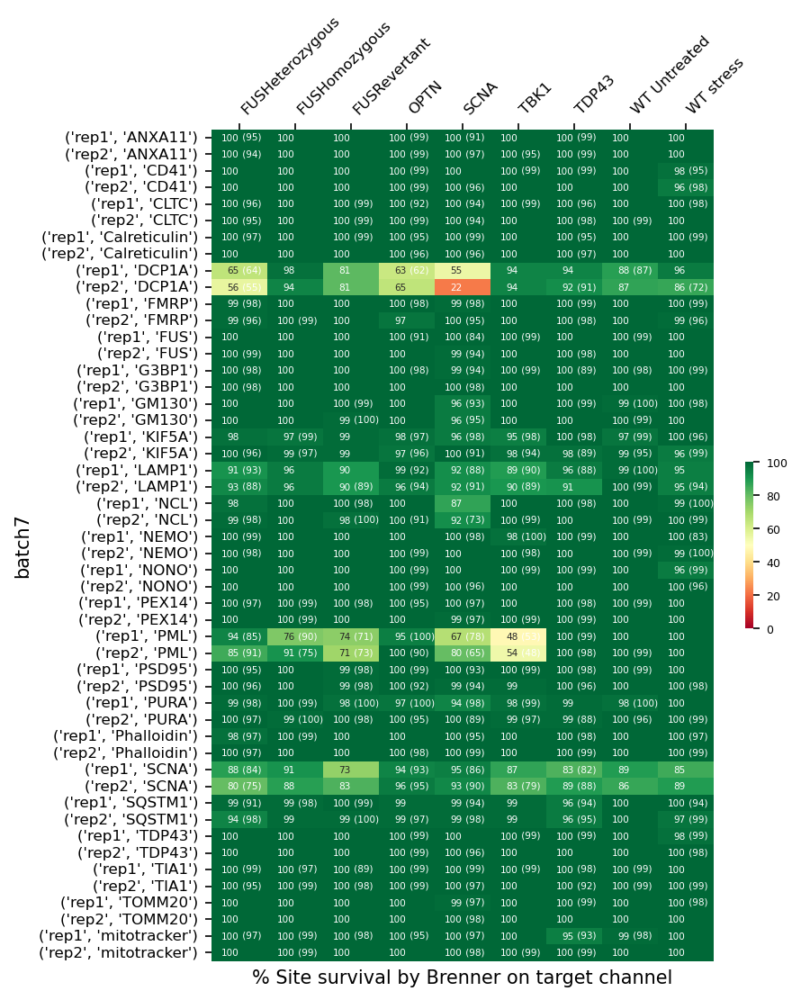

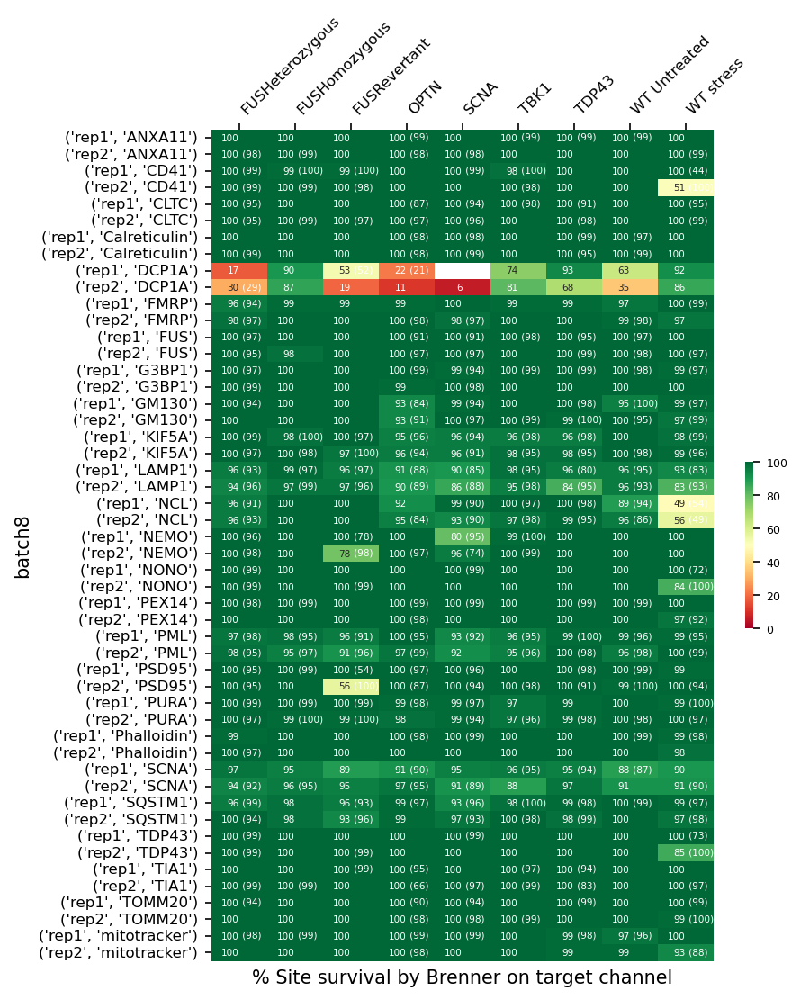

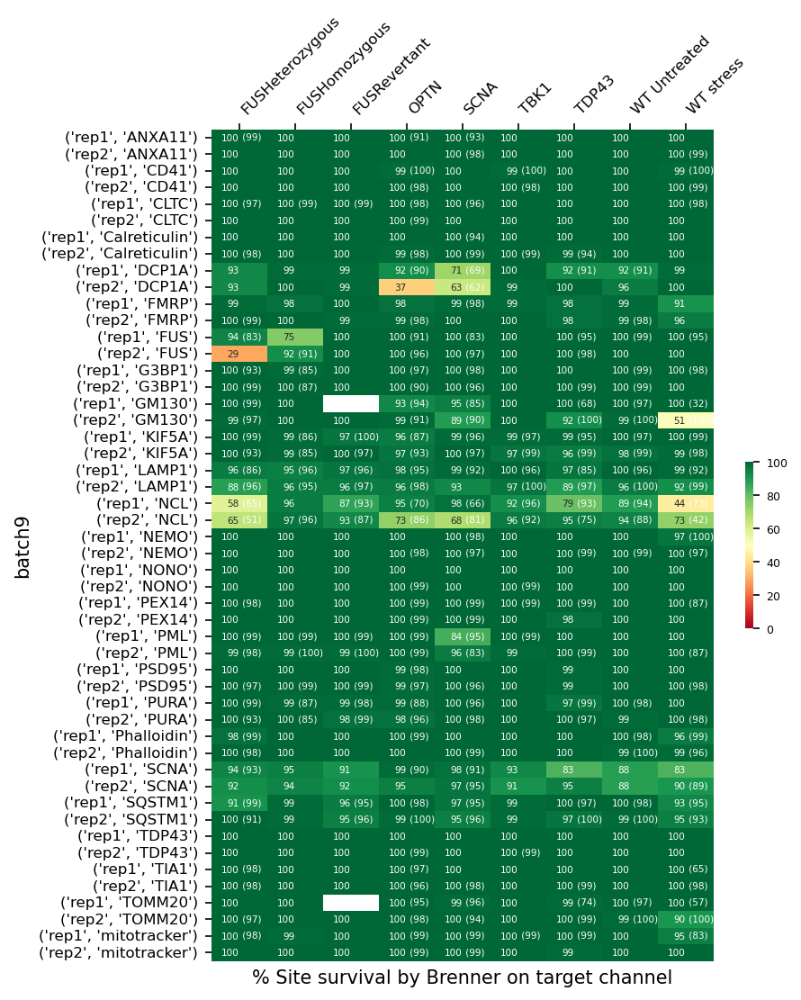

In [18]:
show_site_survival_target_brenner(df_dapi, df_target, dapi_filter_by_tiling, markers)

## Statistics About the Processed Files

In [19]:
names = ['Total number of tiles', 'Total number of whole cells']
stats = ['n_valid_tiles','site_whole_cells_counts_sum','site_cell_count','site_cell_count_sum']
total_sum = calc_total_sums(df_target, df_dapi, stats, markers)

### Total tiles

In [20]:
## Are we using FMRP? and batch3-5?
total_sum[(total_sum.batch.str.contains('6|7|8|9', regex=True)) 
          & (~total_sum.marker.str.contains('TIA|DAPI', regex=True))].n_valid_tiles.sum()

1164303

### Total Dapi tiles


In [21]:
total_sum[(total_sum.batch.str.contains('6|7|8|9', regex=True)) 
          & (total_sum.marker == 'DAPI')].n_valid_tiles.sum()

536624

### Total neurons

In [22]:
total_sum[(total_sum.batch.str.contains('6|7|8|9', regex=True)) 
          & (~total_sum.marker.str.contains('TIA|DAPI', regex=True))].site_cell_count_sum.sum()

5236032.0

### Total Dapi neurons

In [23]:
total_sum[(total_sum.batch.str.contains('6|7|8|9', regex=True)) 
          & (total_sum.marker == 'DAPI')].site_cell_count_sum.sum()

2388700.0

<Axes: >

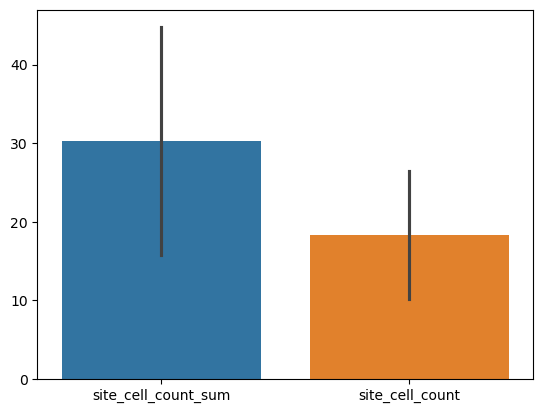

In [24]:
import seaborn as sns
sns.barplot(df_dapi[['site_cell_count_sum','site_cell_count']], errorbar='sd')

### Total tiles in training batches

In [25]:
total_sum[(total_sum.batch.str.contains('7|8', regex=True)) & (~total_sum.marker.str.contains('TIA|DAPI', regex=True))].n_valid_tiles.sum()

562704

### Total neurons in training batches

In [26]:
total_sum[(total_sum.batch.str.contains('7|8', regex=True)) 
          & (~total_sum.marker.str.contains('TIA|DAPI', regex=True))].site_cell_count_sum.sum()

2431381.0

In [27]:
show_total_sum_tables(total_sum)

,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch6,,,,
count,645.000000,645.000000,645.000000,6.450000e+02
mean,695.674419,6.956744,741.423256,1.947064e+03
std,178.072058,1.780721,193.933512,5.275288e+02
min,34.000000,0.340000,36.000000,8.400000e+01
25%,577.000000,5.770000,612.000000,1.569000e+03
50%,705.000000,7.050000,755.000000,1.976000e+03
75%,814.000000,8.140000,863.000000,2.324000e+03
max,1095.000000,10.950000,1189.000000,2.996000e+03
sum,448710.000000,NaN,478218.000000,1.255856e+06


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch7,,,,
count,648.000000,648.000000,648.000000,6.480000e+02
mean,668.841049,6.688410,712.540123,1.735125e+03
std,185.421616,1.854216,202.016806,5.084607e+02
min,129.000000,1.290000,138.000000,3.230000e+02
25%,536.000000,5.360000,567.000000,1.350750e+03
50%,668.000000,6.680000,702.000000,1.758000e+03
75%,804.000000,8.040000,855.000000,2.117500e+03
max,1178.000000,11.780000,1261.000000,3.164000e+03
sum,433409.000000,NaN,461726.000000,1.124361e+06


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch8,,,,
count,647.000000,647.000000,647.000000,6.470000e+02
mean,629.069552,6.290696,667.505410,1.677734e+03
std,173.432002,1.734320,187.446288,4.999782e+02
min,44.000000,0.440000,46.000000,9.200000e+01
25%,517.000000,5.170000,545.000000,1.348000e+03
50%,620.000000,6.200000,659.000000,1.652000e+03
75%,743.000000,7.430000,801.000000,2.060000e+03
max,1086.000000,10.860000,1189.000000,2.996000e+03
sum,407008.000000,NaN,431876.000000,1.085494e+06


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch9,,,,
count,645.000000,645.000000,645.000000,6.450000e+02
mean,703.877519,7.038775,751.767442,1.935143e+03
std,202.101326,2.021013,219.785183,5.705543e+02
min,92.000000,0.920000,97.000000,2.240000e+02
25%,557.000000,5.570000,593.000000,1.504000e+03
50%,717.000000,7.170000,762.000000,2.035000e+03
75%,859.000000,8.590000,924.000000,2.359000e+03
max,1205.000000,12.050000,1323.000000,3.215000e+03
sum,454001.000000,NaN,484890.000000,1.248167e+06


,n valid tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
All batches,,,,
count,2.585000e+03,2585.000000,2.585000e+03,2.585000e+03
mean,6.743242e+02,6.743242,7.182631e+02,1.823550e+03
std,1.872508e+02,1.872508,2.036721e+02,5.402926e+02
min,3.400000e+01,0.340000,3.600000e+01,8.400000e+01
25%,5.410000e+02,5.410000,5.730000e+02,1.441000e+03
50%,6.760000e+02,6.760000,7.180000e+02,1.819000e+03
75%,7.980000e+02,7.980000,8.540000e+02,2.220000e+03
max,1.205000e+03,12.050000,1.323000e+03,3.215000e+03
sum,1.743128e+06,NaN,1.856710e+06,4.713878e+06


### Show Total Tile Counts
For each batch, cell line, replicate and markerTotal number of tiles

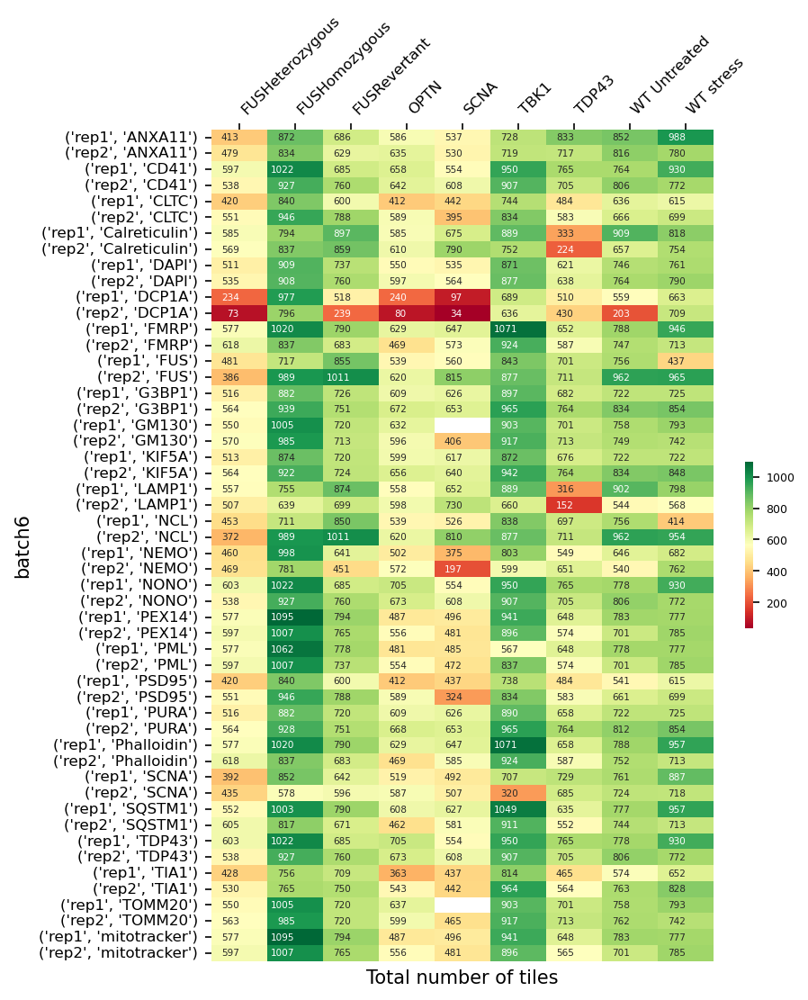

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


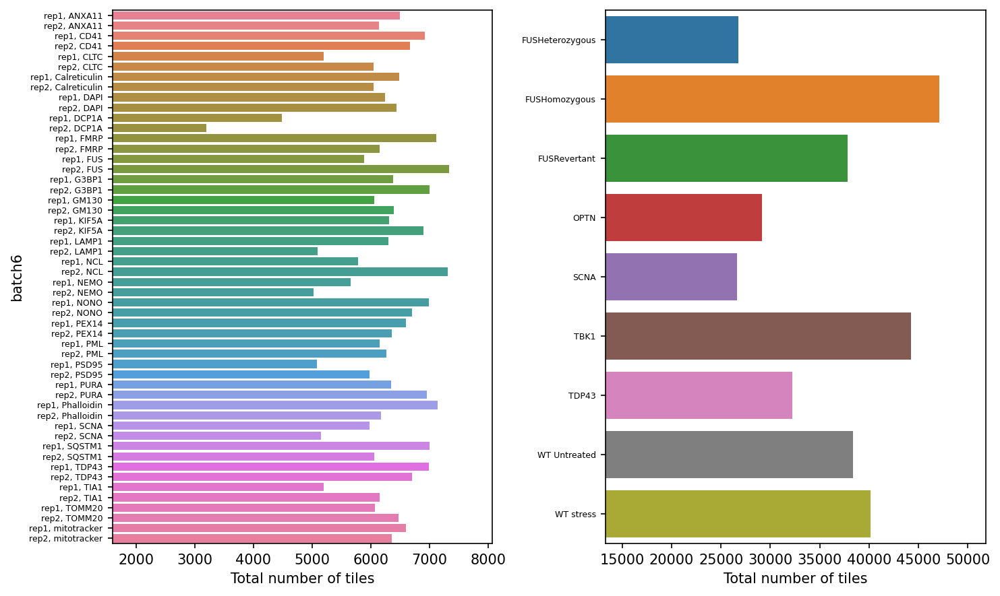

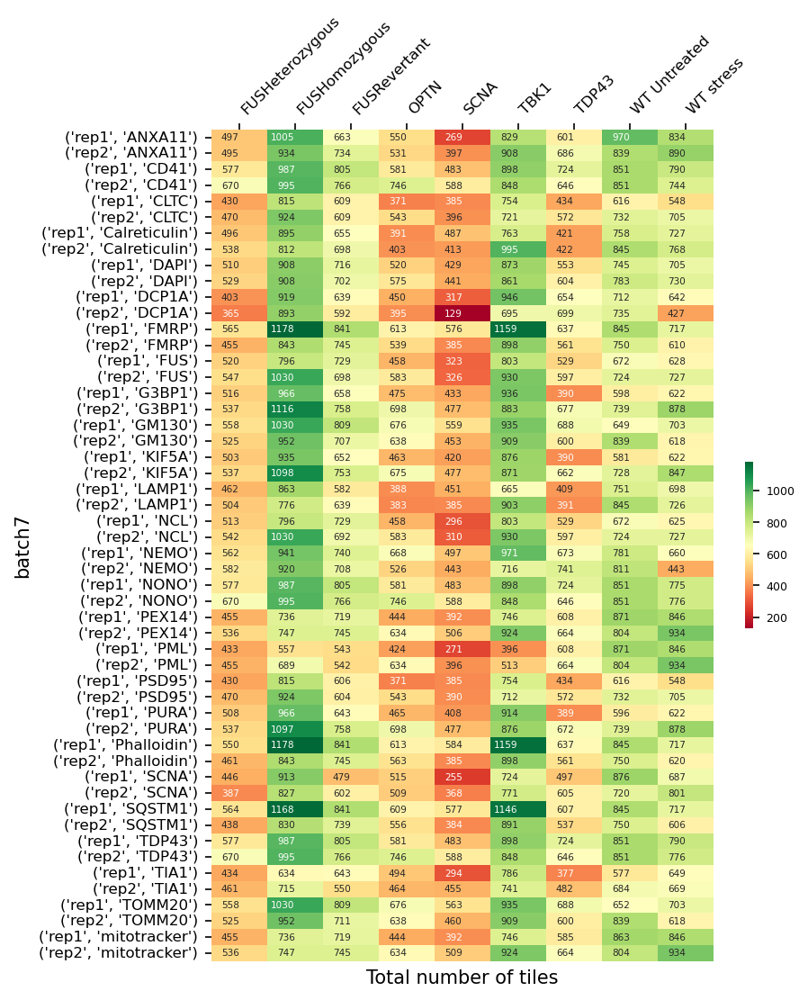

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


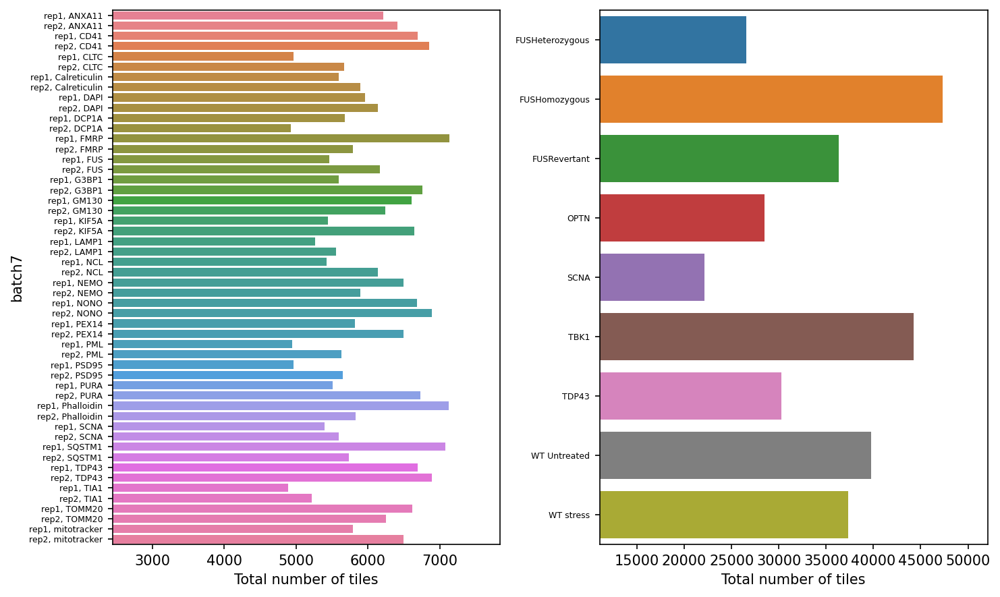

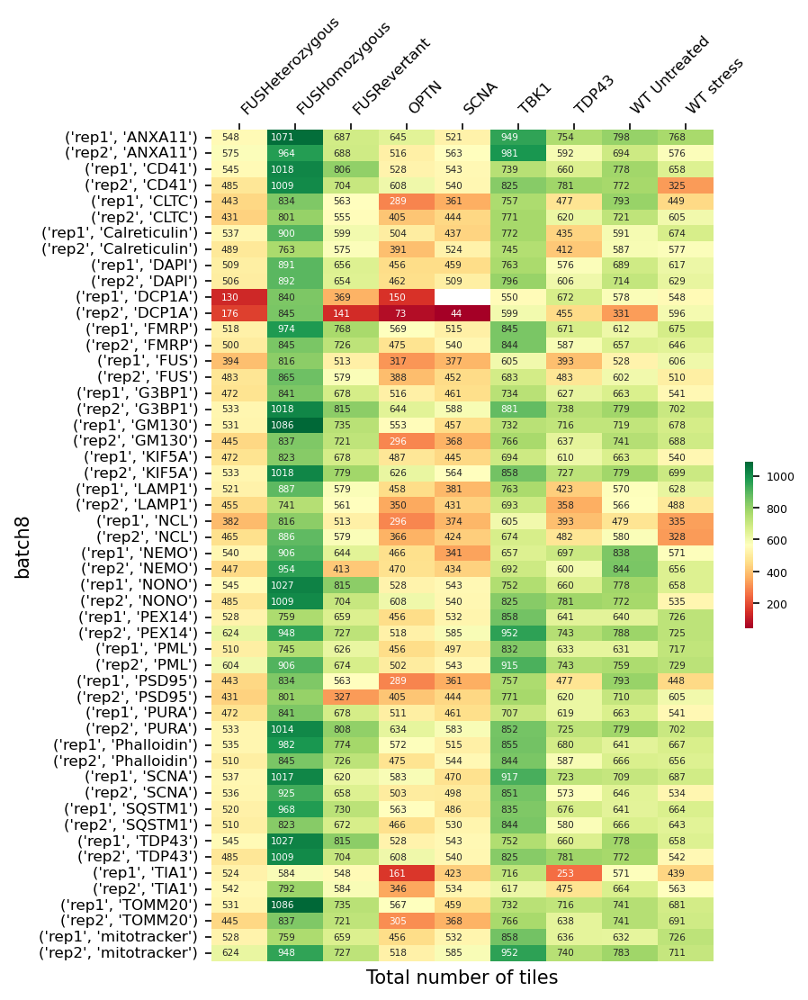

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


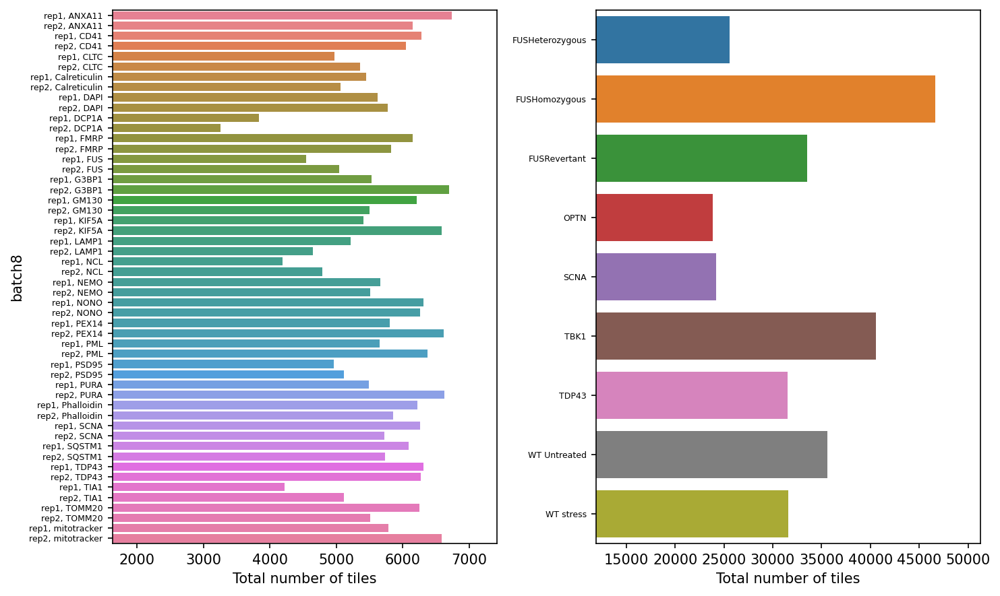

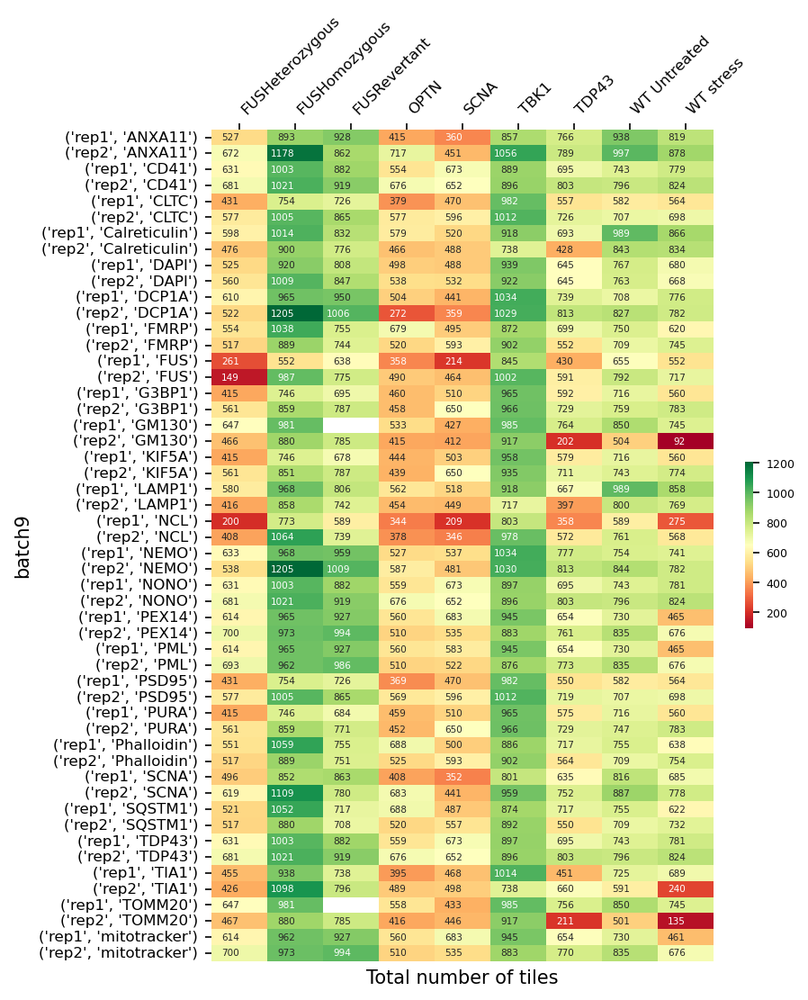

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


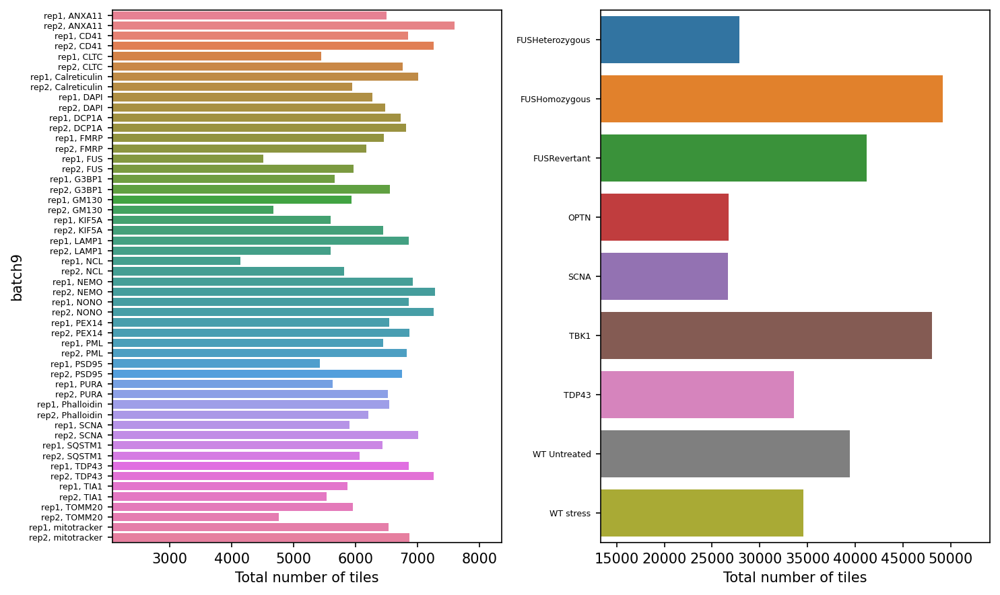

In [28]:
to_heatmap = total_sum.rename(columns={'n_valid_tiles':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of tiles', show_sum=True, figsize=(6,8))

### Show Total Whole Cell Counts
For each batch, cell line, replicate and markerTotal number of tiles

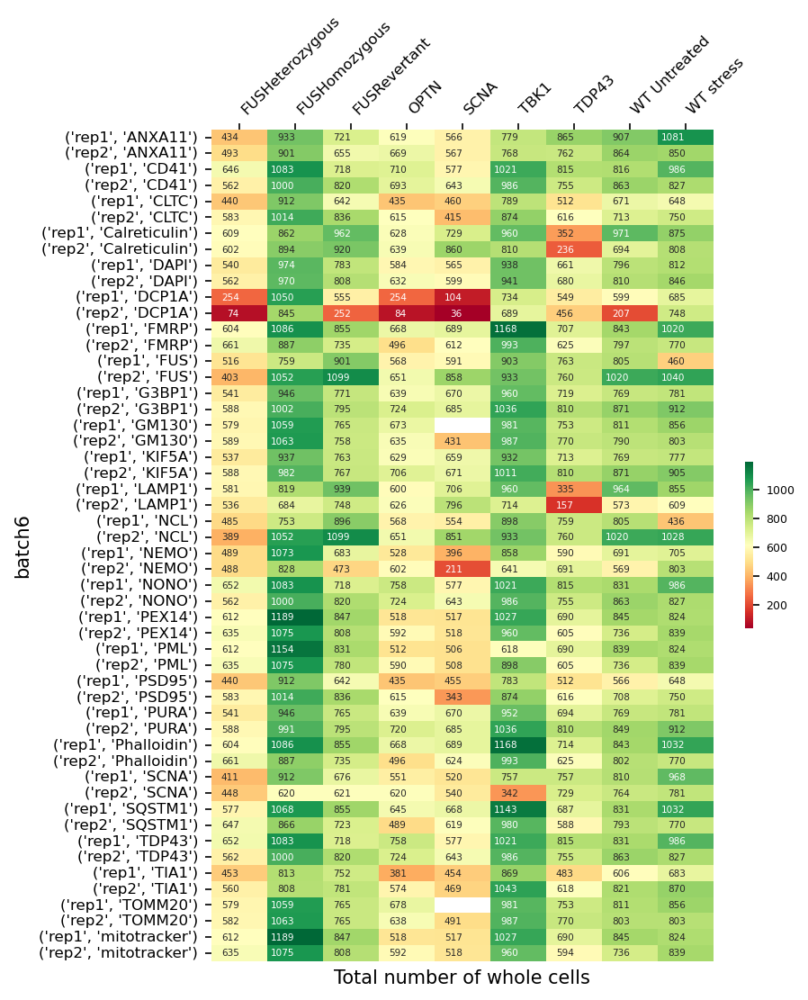

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


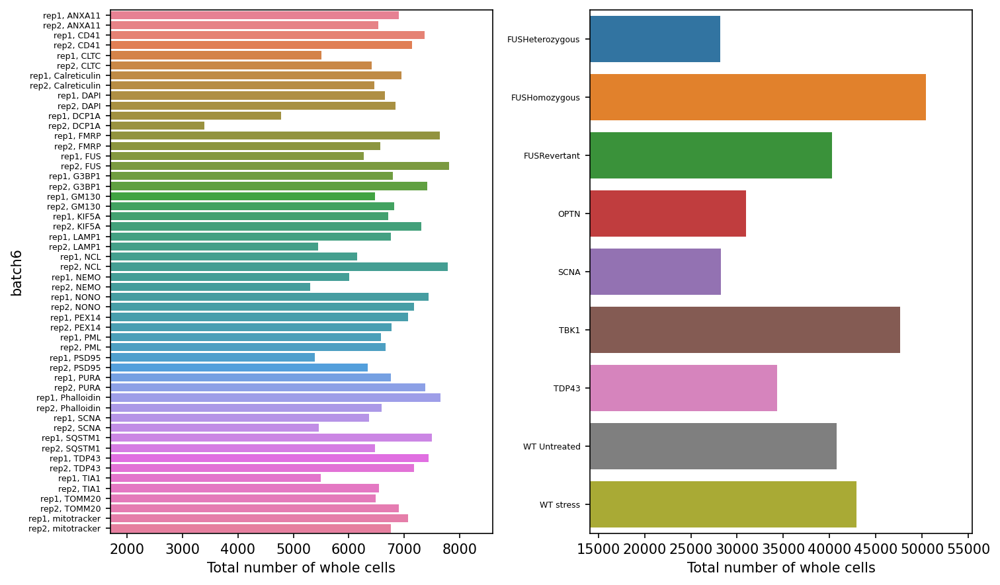

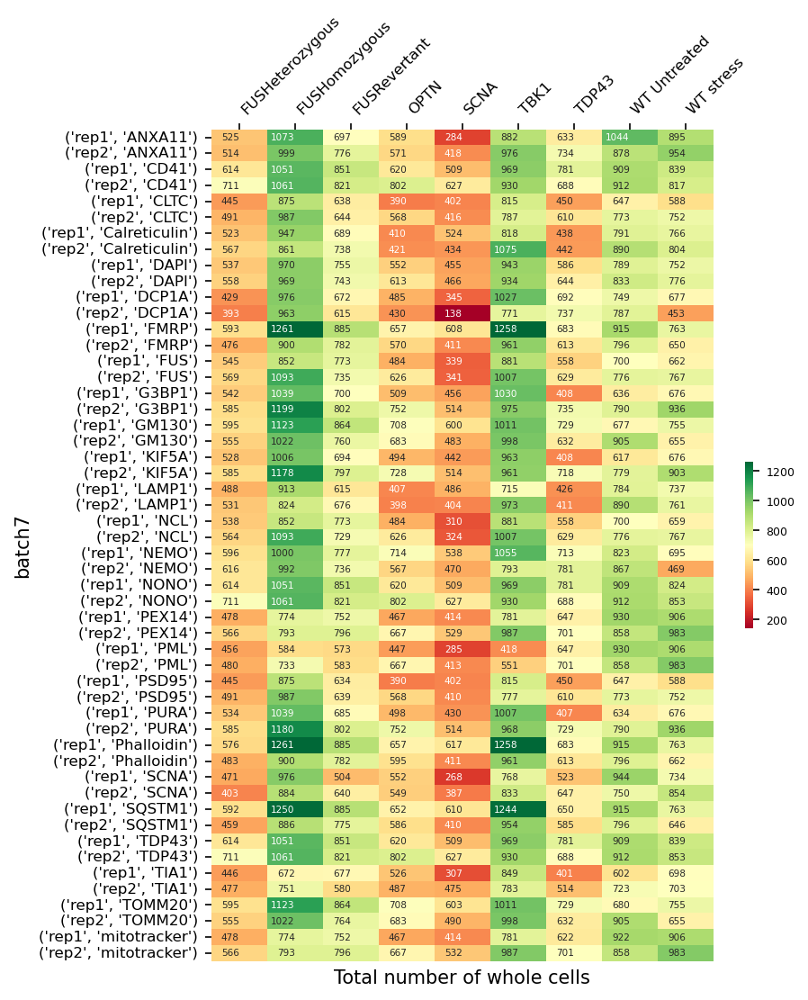

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


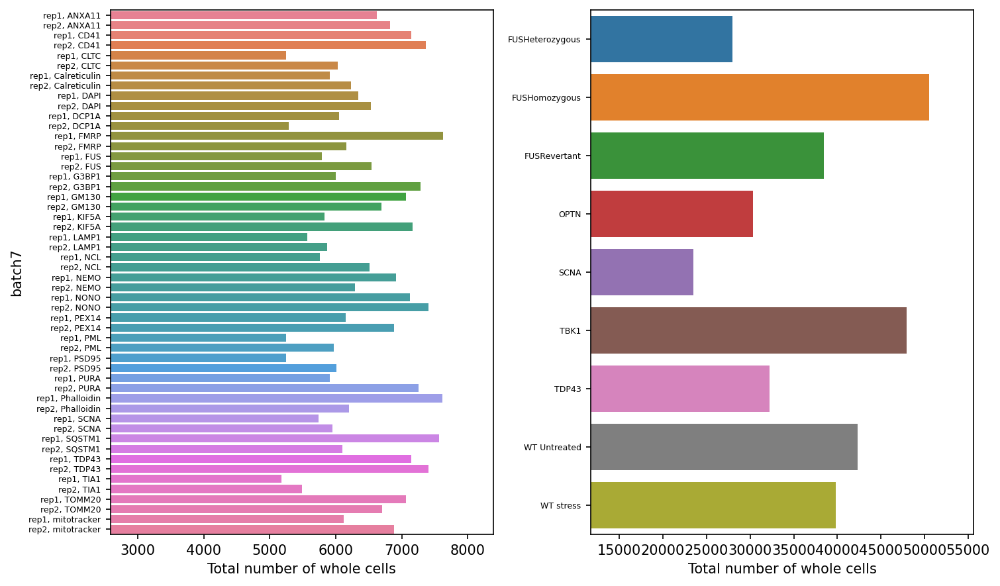

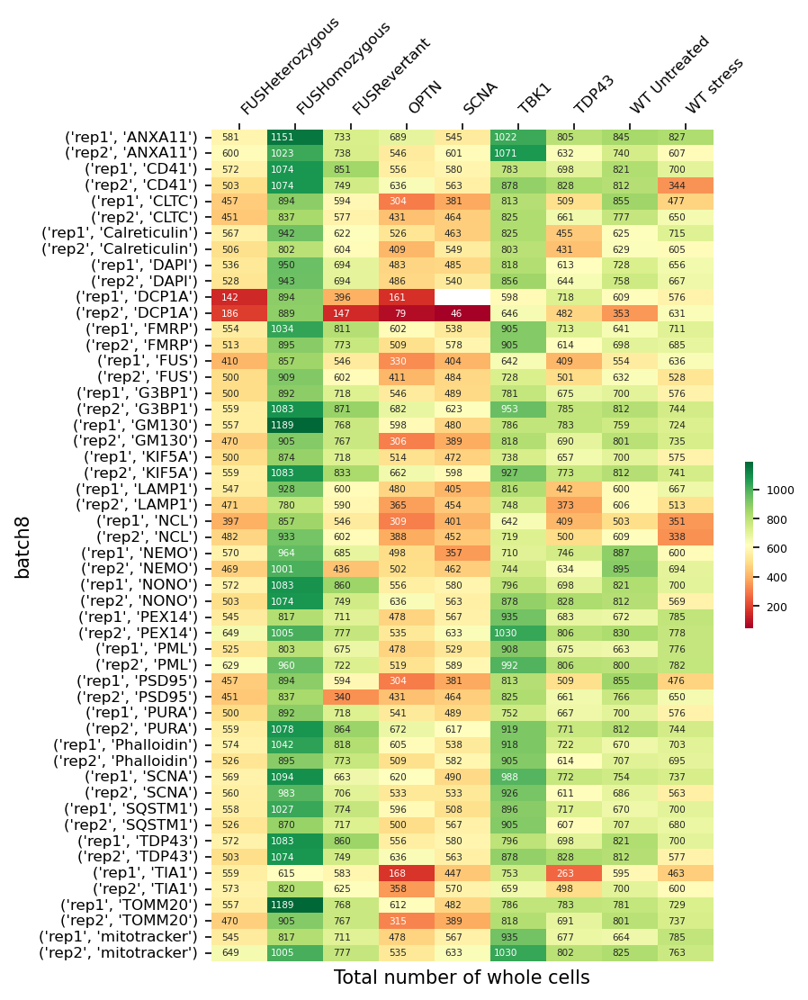

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


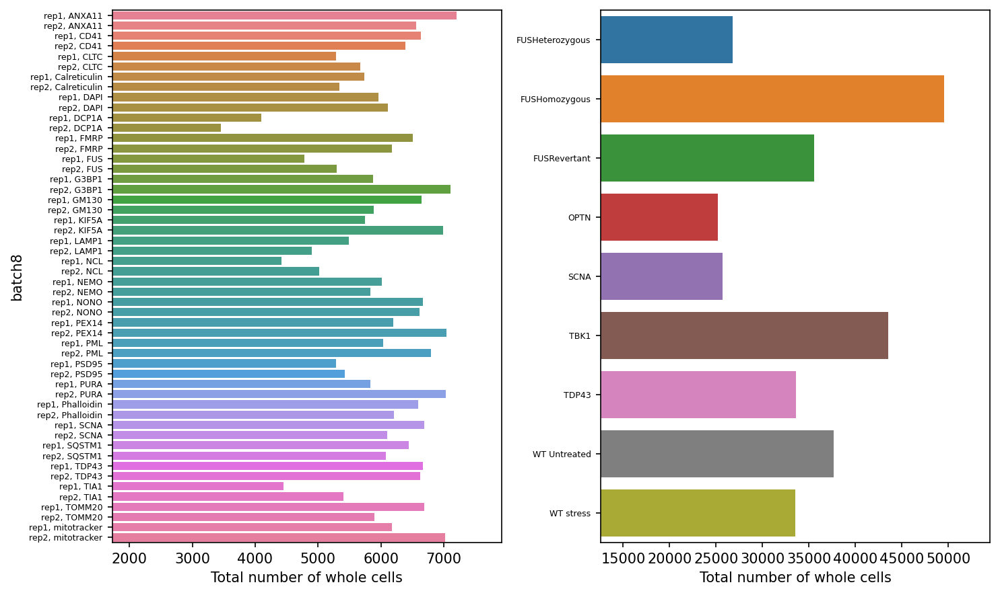

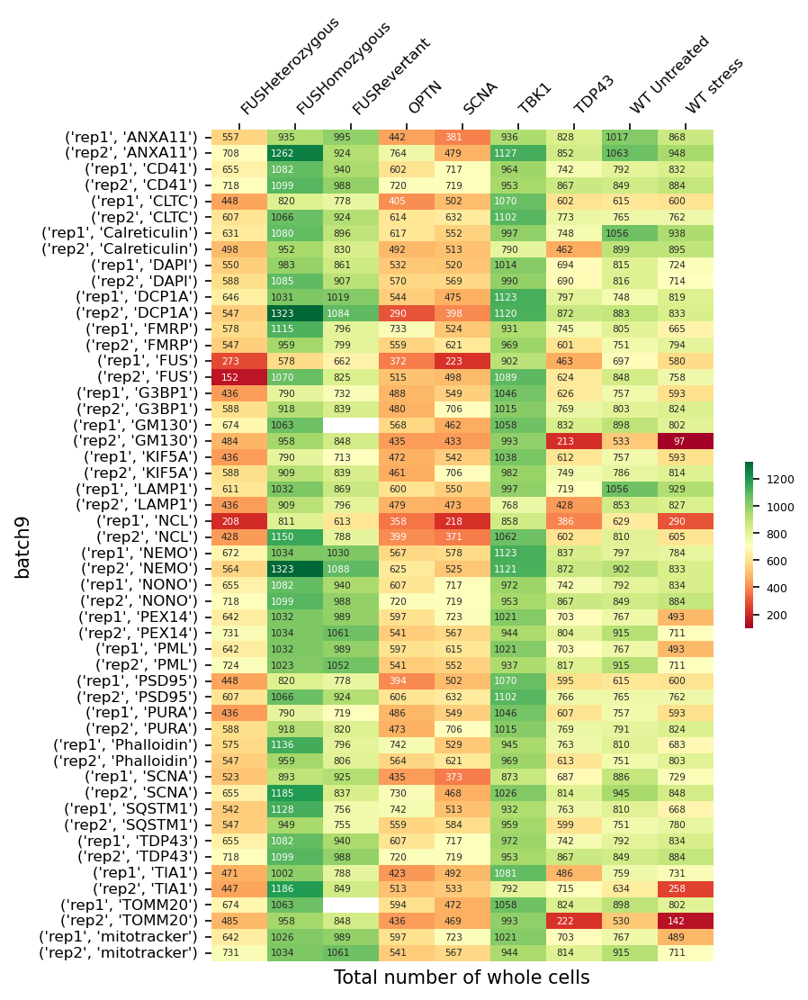

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


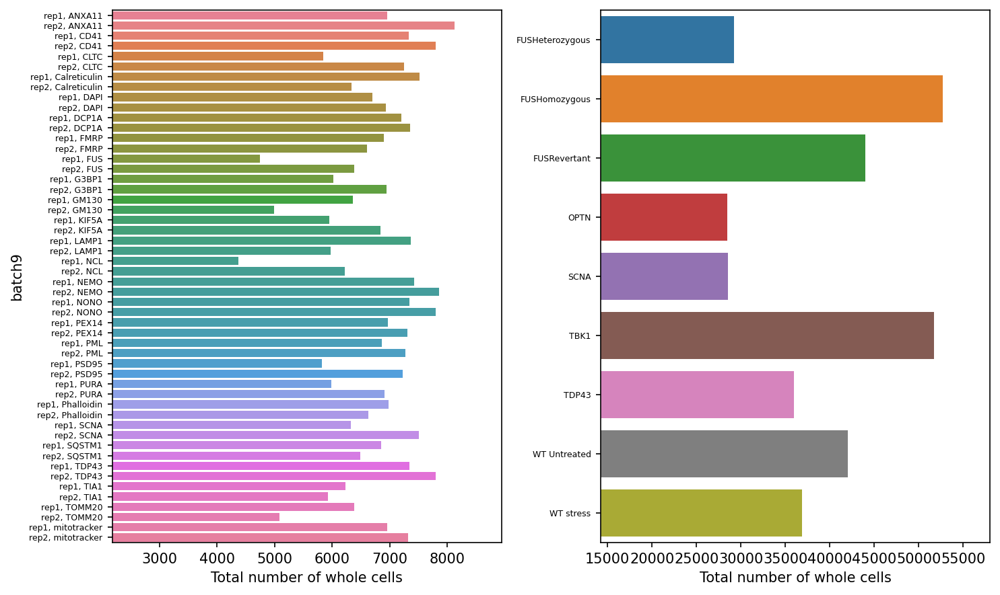

In [29]:
to_heatmap = total_sum.rename(columns={'site_whole_cells_counts_sum':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of whole cells', show_sum=True, figsize=(6,8))

### Show **Cell Count** Statistics per Batch

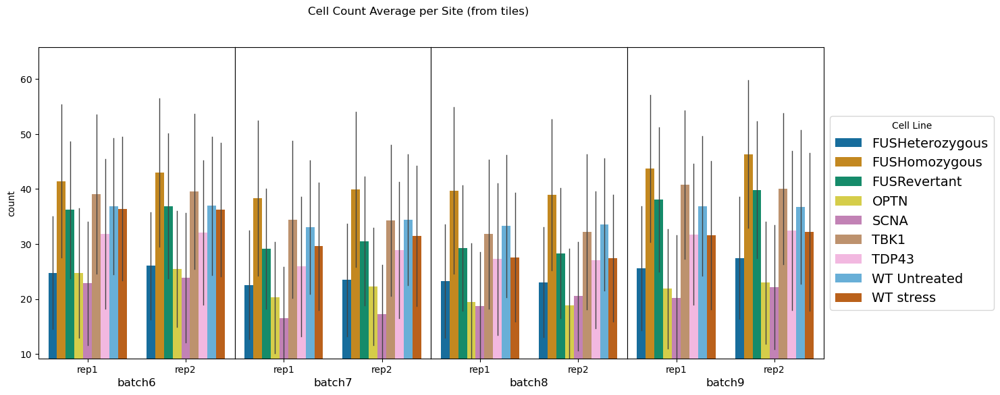

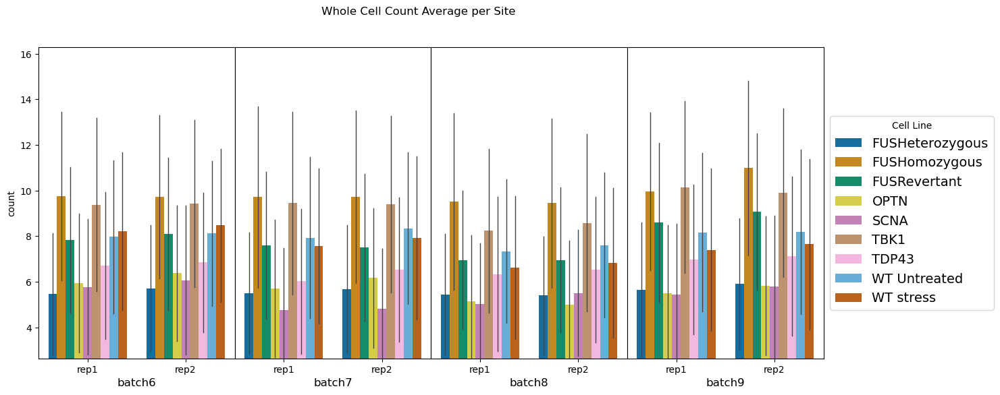

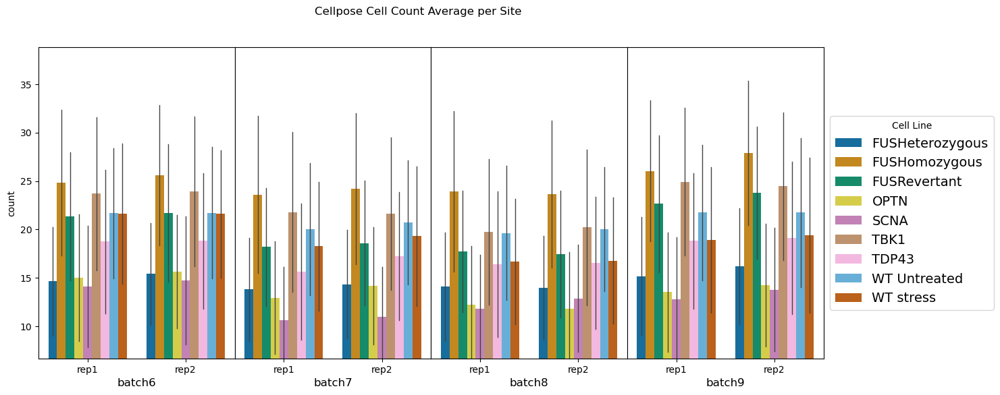

In [30]:
df_no_empty_sites = df_dapi[df_dapi.n_valid_tiles !=0]
plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_cell_count_sum', 
                title='Cell Count Average per Site (from tiles)')

plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_whole_cells_counts_sum',
                title='Whole Cell Count Average per Site')

plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_cell_count',
               title='Cellpose Cell Count Average per Site')


### Show **Tiles** per Site Statistics


In [31]:
df_dapi.groupby(['cell_line_cond']).n_valid_tiles.mean()

cell_line_cond
FUSHeterozygous    5.248832
FUSHomozygous      9.192627
FUSRevertant       7.358567
OPTN               5.259200
SCNA               4.954593
TBK1               8.633728
TDP43              6.116851
WT Untreated       7.470715
WT stress          6.994417
Name: n_valid_tiles, dtype: float64

ERROR! Session/line number was not unique in database. History logging moved to new session 1484


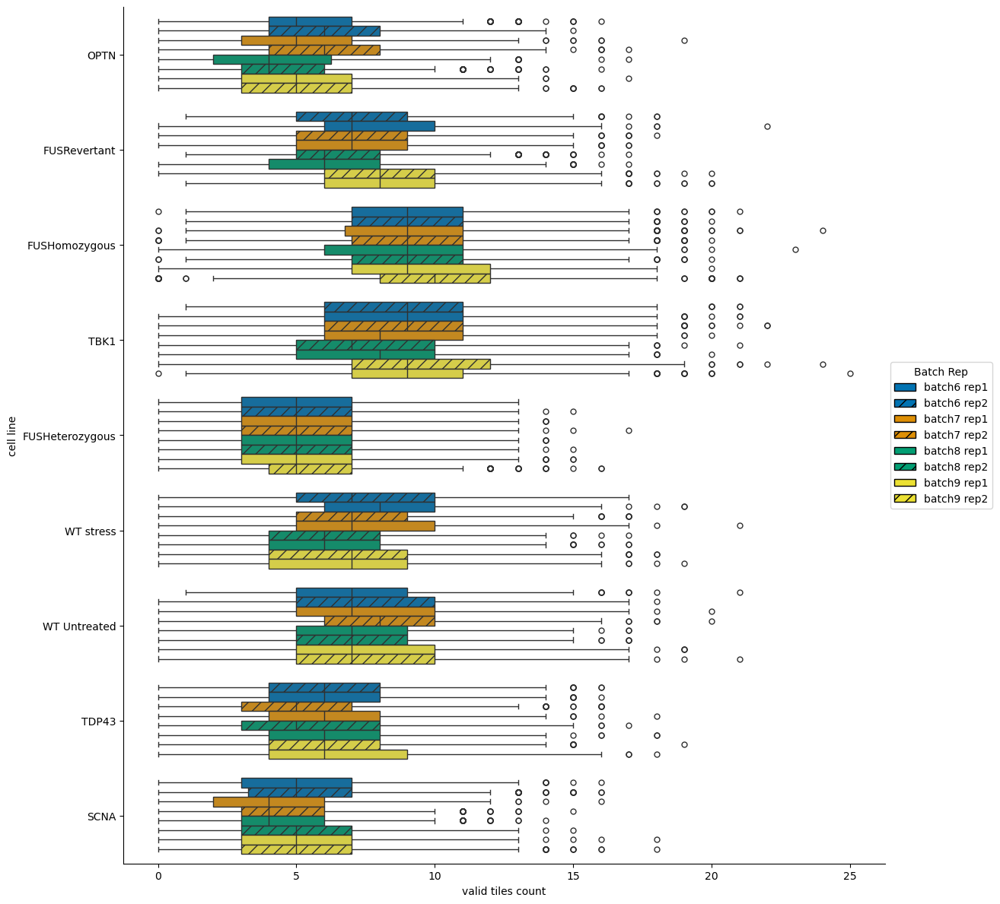

In [35]:
plot_catplot(df_dapi, custom_palette,reps, x='n_valid_tiles', x_title='valid tiles count', batch_min=6, batch_max=9)


### Show Mean of cell count in valid tiles

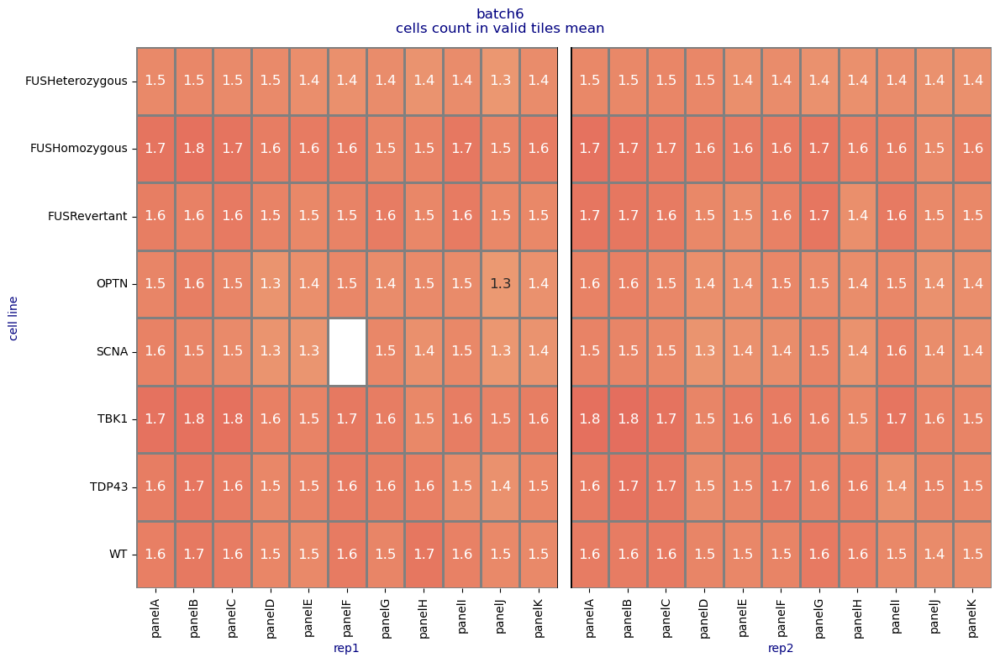

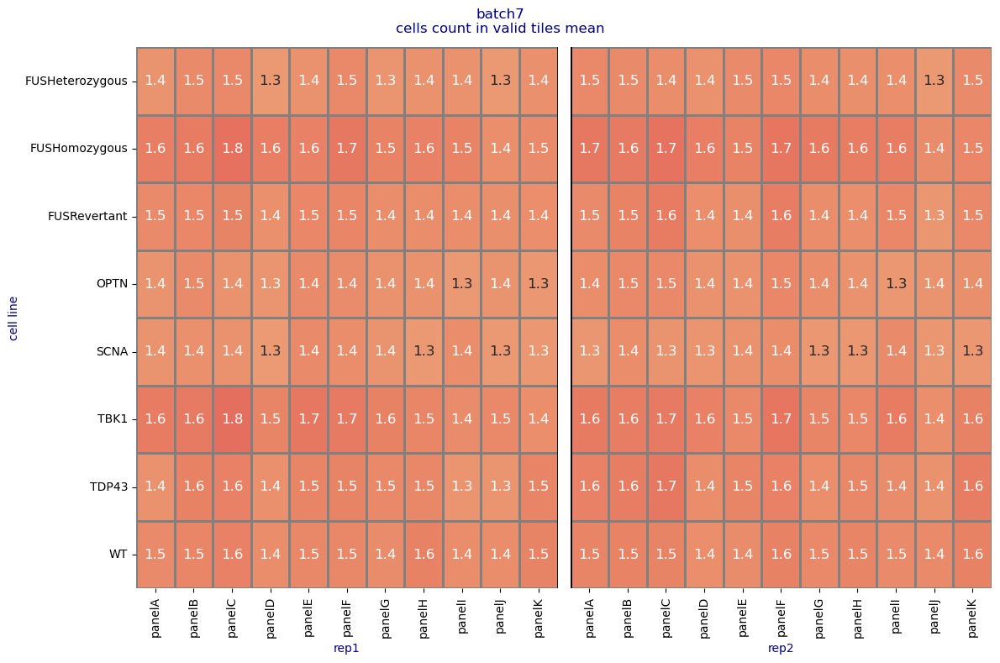

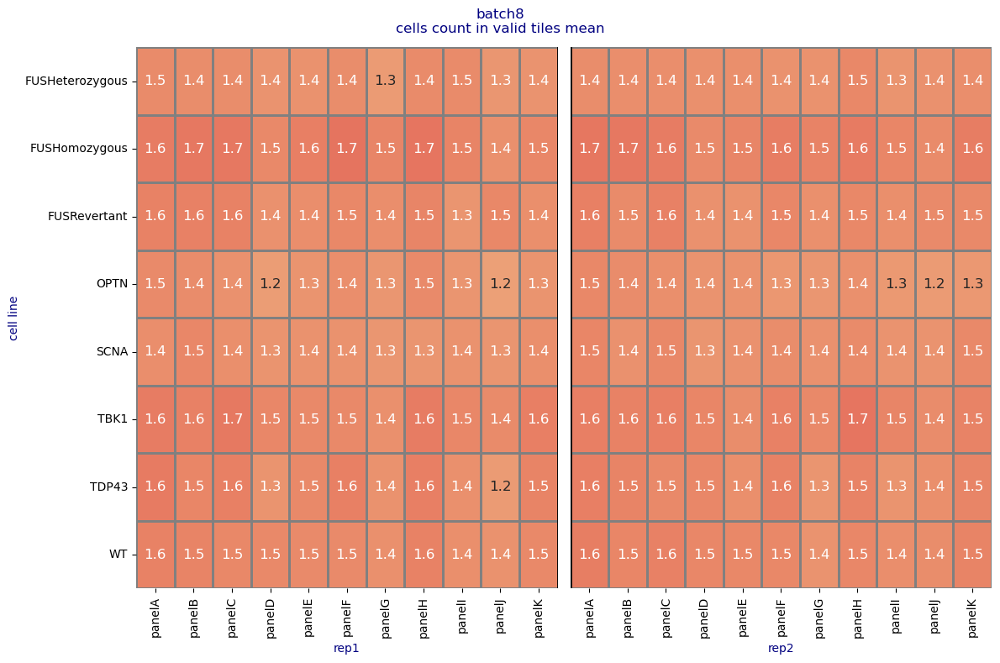

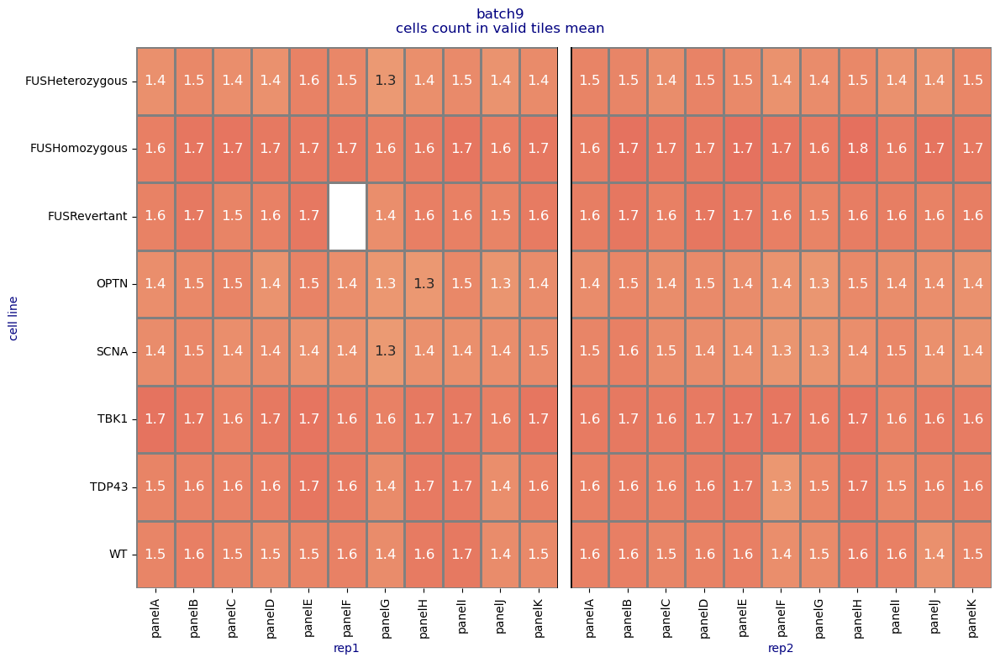

In [33]:
plot_hm(df_dapi, split_by='rep', rows='cell_line', columns='panel')

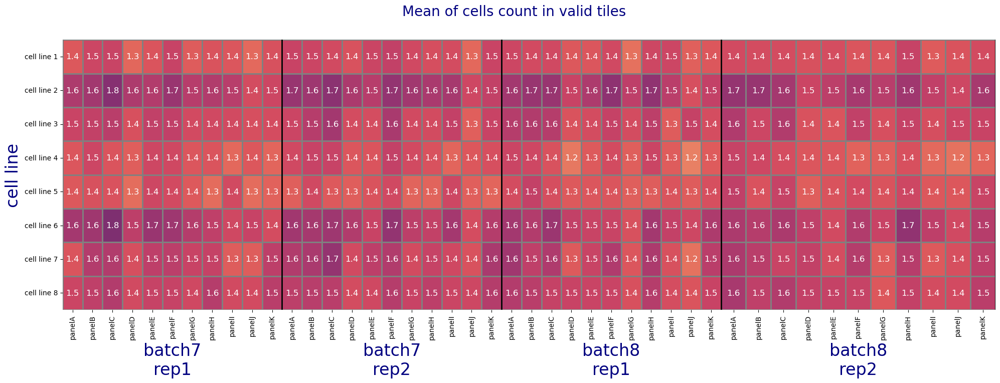

In [34]:
## Only batches 7&8
plot_hm_combine_batches(df_dapi,  batches=['batch7','batch8'], 
                        reps = ['rep1','rep2'],rows='cell_line', columns='panel')


# Assessing Staining Reproducibility and Outliers

batch6


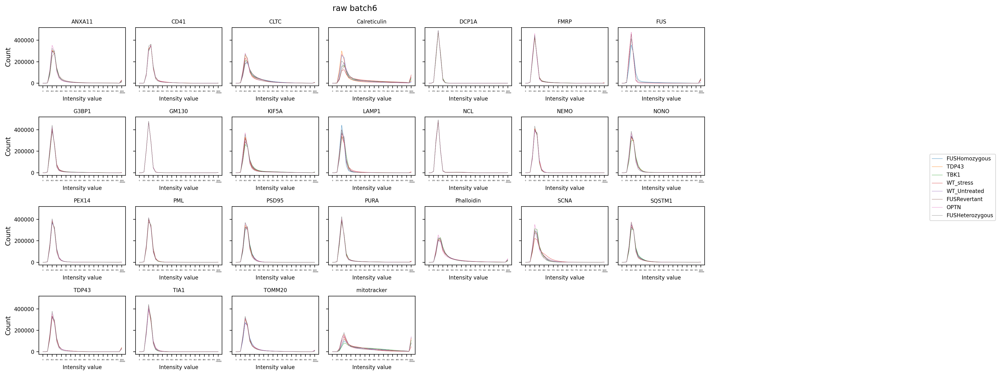

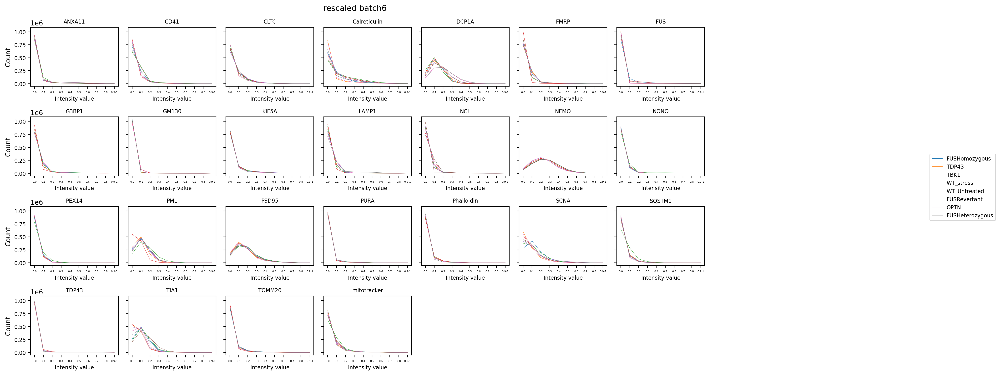

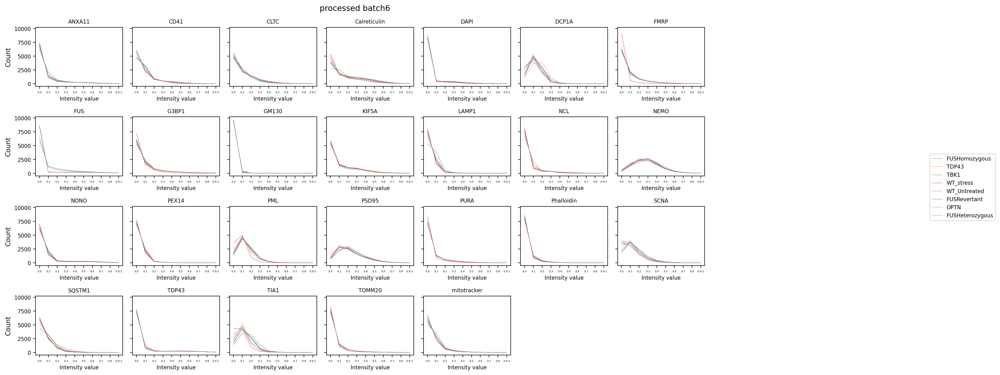

batch7


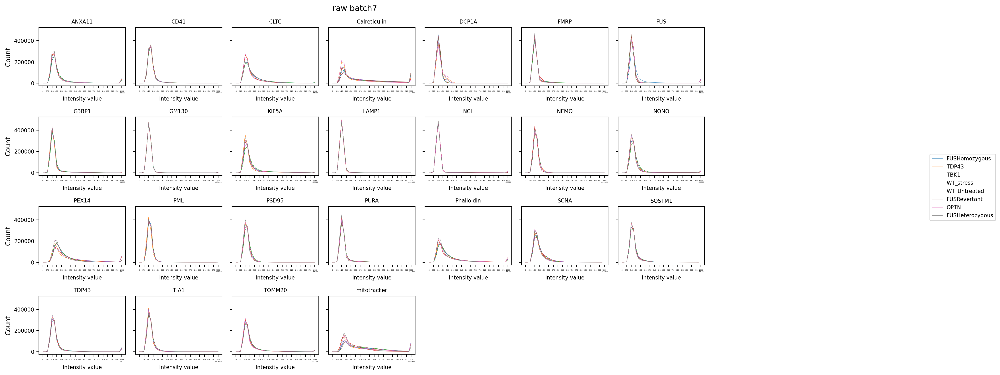

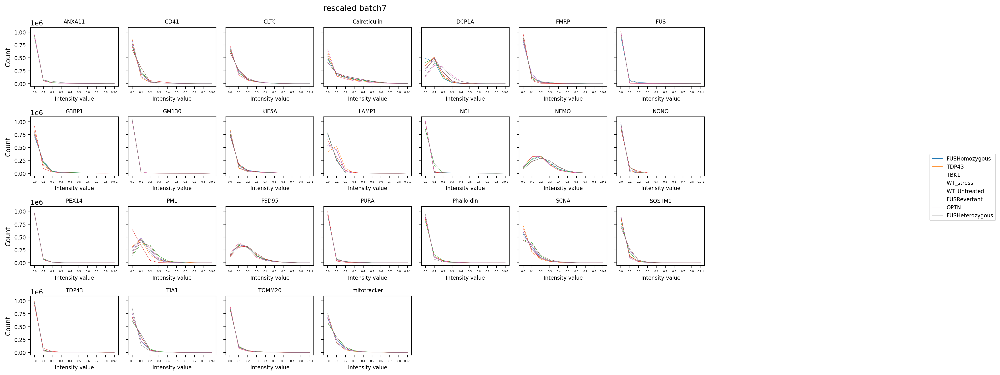

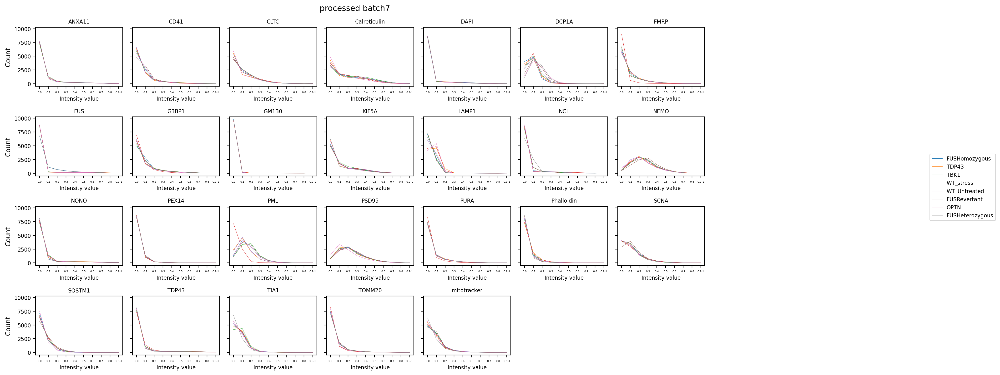

batch8


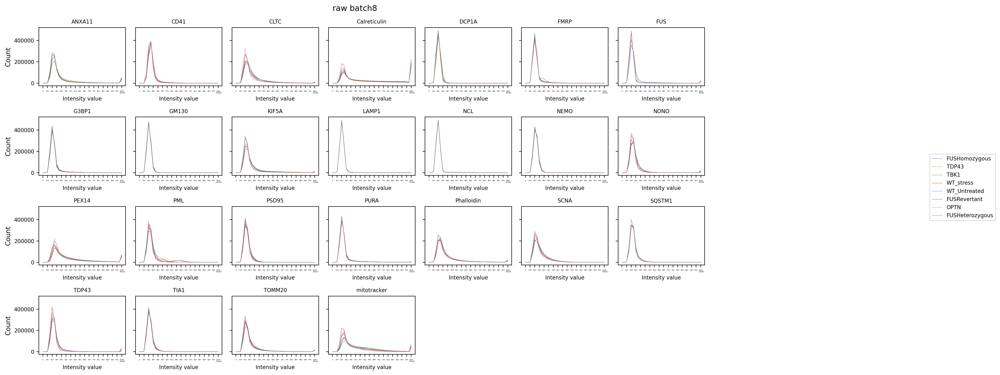

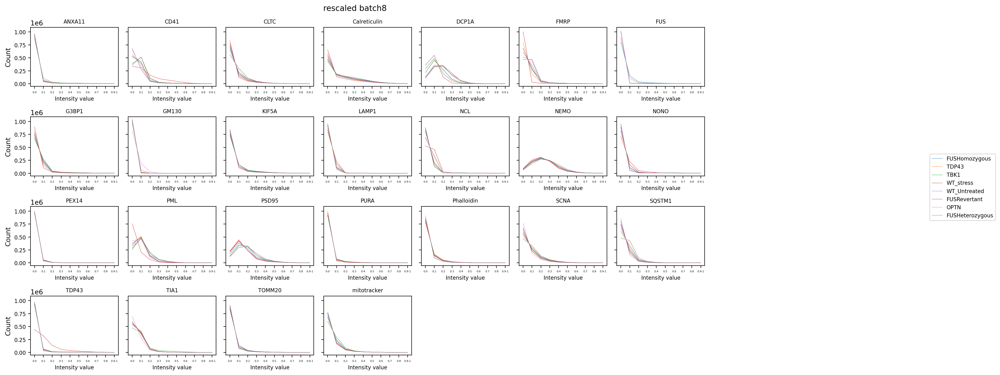

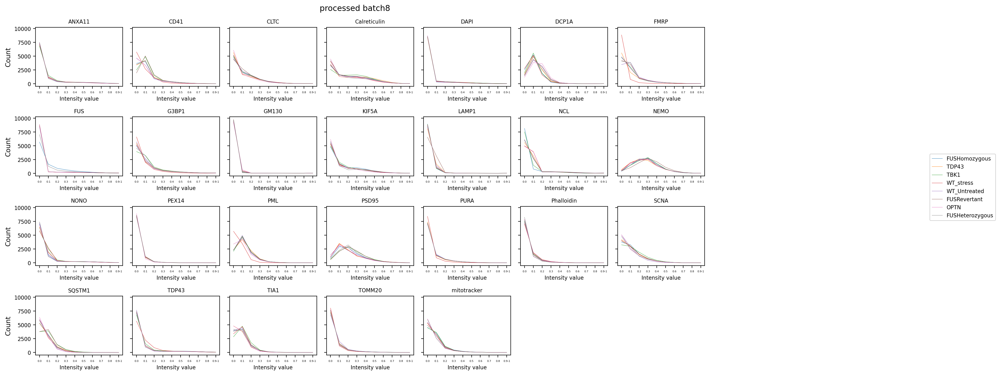

batch9


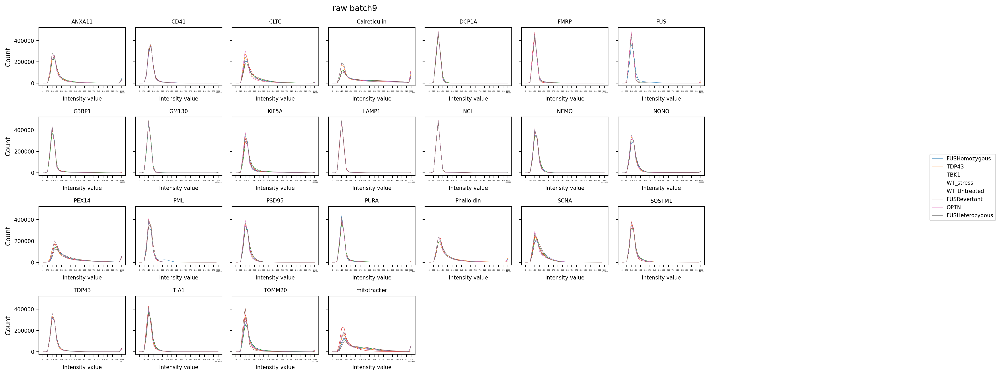

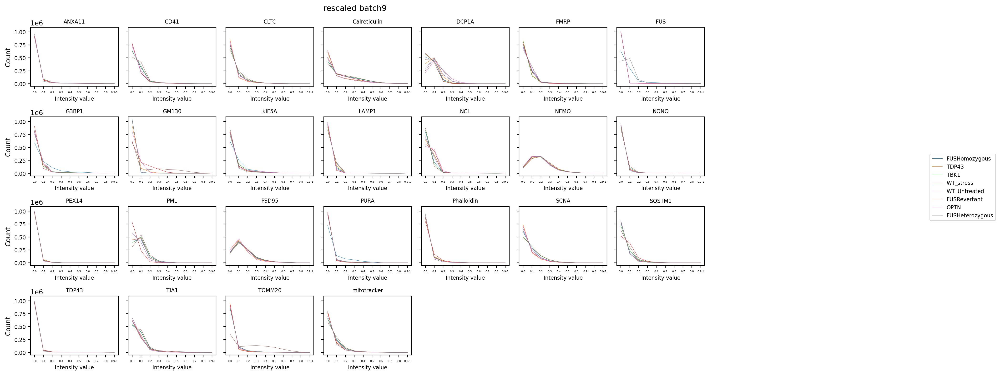

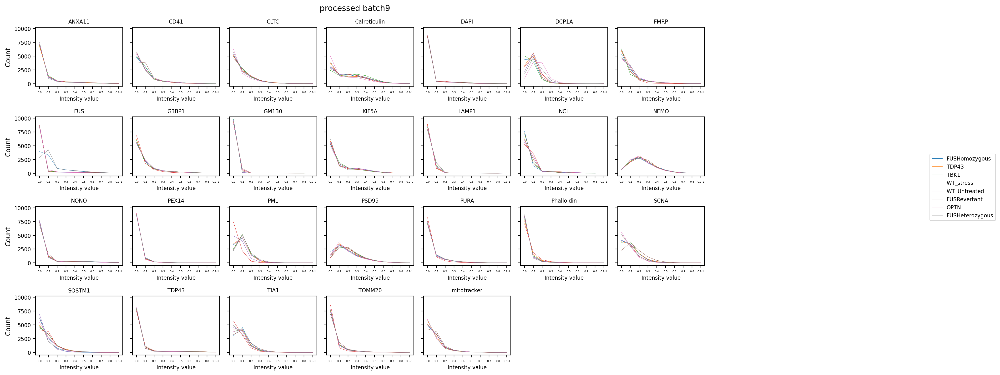

In [36]:
for batch in batches:
    print(batch)
    #batch_num = batch.replace('batch',"")
    run_calc_hist_new(batch,cell_lines_for_disp, markers, root_directory_raw, root_directory_proc,
                           hist_sample=10,sample_size_per_markers=200, ncols=7, nrows=4)
    print("="*30)
    

In [37]:
# save notebook as HTML ( the HTML will be saved in the same folder the original script is)
display(Javascript('IPython.notebook.save_checkpoint();'))
os.system('jupyter nbconvert --to html src/preprocessing/notebooks/no_ds/qc_report_d8.ipynb')

<IPython.core.display.Javascript object>

[NbConvertApp] Converting notebook src/preprocessing/notebooks/no_ds/qc_report_newPP.ipynb to html
[NbConvertApp] Writing 18268598 bytes to src/preprocessing/notebooks/no_ds/qc_report_newPP.html


0